<a href="https://colab.research.google.com/github/pojii/2110215_Exercise0_HelloGitHub/blob/master/Copy_of_Annotated_Transformer_Clone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

A clone of this paper [Annotated Transformer](http://nlp.seas.harvard.edu/annotated-transformer/) with notes added by me.

Alex Ambrioso (April 2022)

The authors of the paper have implemented the orginal transformer from [Attention is All You Need](https://arxiv.org/pdf/1706.03762.pdf) with up-to-date libraries.  I am working through their implementation and adding some explanatory code and notes.  My goal is to understand this paper well enough so that if I were stranded on a desert island with enough compute I would be able to re-implement a transformer.

***To run this file:***

* Enable GPUs by changing the runtime type in the runtime menu.
* Turn on MyDrive.
* If necessary, remove vocab.pt in datasets file on MyDrive.  This file is created when a new vocabulary is built.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
merged_df = pd.read_csv('/content/drive/MyDrive/dataset/merged_df.csv')

In [ ]:
!pip install tensorflow_text
import tensorflow_hub as hub
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import LSTM, Dense, Input, Embedding
from tensorflow.keras.models import Model
# multivariate multi-step encoder-decoder lstm example
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.callbacks import EarlyStopping
import tensorflow_hub as hub
import numpy as np
import tensorflow_text
from sklearn.neighbors import NearestCentroid
import os
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import pandas as pd
import itertools
from random import sample

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 61.5 MB/s eta 0:00:00


In [ ]:
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-multilingual-large/3")

In [ ]:
!pip install numpy matplotlib scikit-learn

In [ ]:
!wget -q https://github.com/google/fonts/raw/main/ofl/sarabun/Sarabun-Regular.ttf
import matplotlib as mpl
mpl.font_manager.fontManager.addfont('Sarabun-Regular.ttf')
mpl.rc('font', family='Sarabun')

In [ ]:
merged_df = merged_df.sort_values(by=['user_id'],ascending=True)

In [ ]:
grouped_df = merged_df.groupby('user_id')['title'].apply(lambda x: x.tolist())

In [ ]:
grouped_df=grouped_df.reset_index()

In [ ]:
grouped_df['joined_titles'] = grouped_df['title'].apply(lambda x: '--'.join(x))

In [ ]:
grouped_df

,user_id,title,joined_titles
0,1,[Relative-Motion Analysis using Rotating Axes:...,Relative-Motion Analysis using Rotating Axes: ...
1,3,[Thailand Smart Factory|Smart Factory คืออะไร?...,Thailand Smart Factory|Smart Factory คืออะไร? ...
2,5,[Software Development Life Cycle|Software Requ...,Software Development Life Cycle|Software Requi...
3,7,[Coordinate Frame and Transformation (พิกัดเฟร...,Coordinate Frame and Transformation (พิกัดเฟรม...
4,12,[Industrial Sensors and Actuators - Encoders|I...,Industrial Sensors and Actuators - Encoders|In...
...,...,...,...
3243,3774,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...
3244,3775,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...
3245,3776,"[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...",Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...
3246,3777,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...


In [ ]:
# grouped_df['array_title'] = grouped_df['embeded_title']
# for ind in grouped_df.index:
#     grouped_df['array_title'][ind]=grouped_df['embeded_title'][ind][-1].numpy()
#     print(grouped_df['user_id'][ind], grouped_df['embeded_title'][ind])

In [ ]:
grouped_df['embeded_title']=grouped_df['title'].apply(lambda x: embed(x)[0])

In [ ]:
grouped_df

,user_id,title,joined_titles,embeded_title
0,1,[Relative-Motion Analysis using Rotating Axes:...,Relative-Motion Analysis using Rotating Axes: ...,"(tf.Tensor(-0.027242709, shape=(), dtype=float..."
1,3,[Thailand Smart Factory|Smart Factory คืออะไร?...,Thailand Smart Factory|Smart Factory คืออะไร? ...,"(tf.Tensor(-0.019321471, shape=(), dtype=float..."
2,5,[Software Development Life Cycle|Software Requ...,Software Development Life Cycle|Software Requi...,"(tf.Tensor(-0.07898392, shape=(), dtype=float3..."
3,7,[Coordinate Frame and Transformation (พิกัดเฟร...,Coordinate Frame and Transformation (พิกัดเฟรม...,"(tf.Tensor(-0.038853455, shape=(), dtype=float..."
4,12,[Industrial Sensors and Actuators - Encoders|I...,Industrial Sensors and Actuators - Encoders|In...,"(tf.Tensor(0.02023062, shape=(), dtype=float32..."
...,...,...,...,...
3243,3774,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019695837, shape=(), dtype=float..."
3244,3775,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019717524, shape=(), dtype=float..."
3245,3776,"[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...",Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...,"(tf.Tensor(0.00093066966, shape=(), dtype=floa..."
3246,3777,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.01969583, shape=(), dtype=float3..."


In [ ]:
titles=grouped_df['joined_titles']
titles_result=grouped_df['embeded_title']
user_ids=grouped_df['user_id']

3248


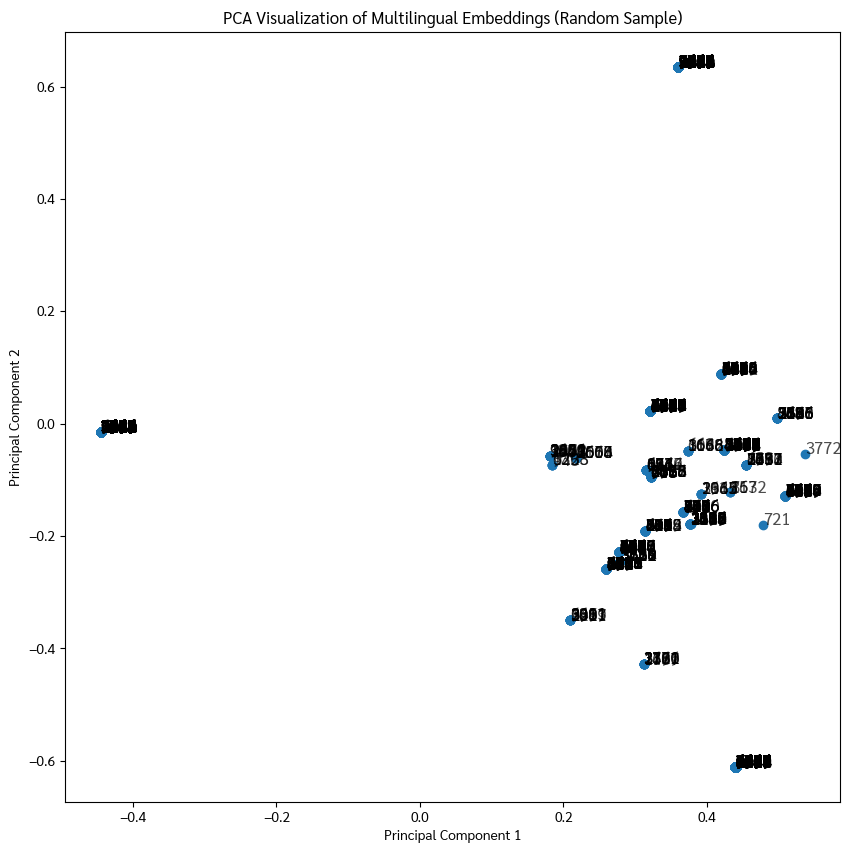

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import random

# Shuffle the titles and their corresponding embeddings
combined = list(zip(titles, titles_result))
# random.shuffle(combined)
shuffled_titles, shuffled_embeddings = zip(*combined)
print(len(titles))
# Sample a random subset of titles (for example, 20 random titles)
num_samples = len(combined)
sampled_titles = shuffled_titles[:num_samples]
sampled_embeddings = shuffled_embeddings[:num_samples]

# Apply PCA to reduce dimensionality to 2 dimensions
pca = PCA(n_components=2)
pca_result = pca.fit_transform(sampled_embeddings)

# Create a scatter plot of the PCA results
plt.figure(figsize=(10, 10))  # Increase figure size

plt.scatter(pca_result[:, 0], pca_result[:, 1])

# Annotate the points with text labels
for i, label in enumerate(user_ids):
    plt.annotate(user_ids[i], (pca_result[i, 0], pca_result[i, 1]), fontsize=12, alpha=0.7)  # Smaller font size and transparent background

plt.title("PCA Visualization of Multilingual Embeddings (Random Sample)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()


3248


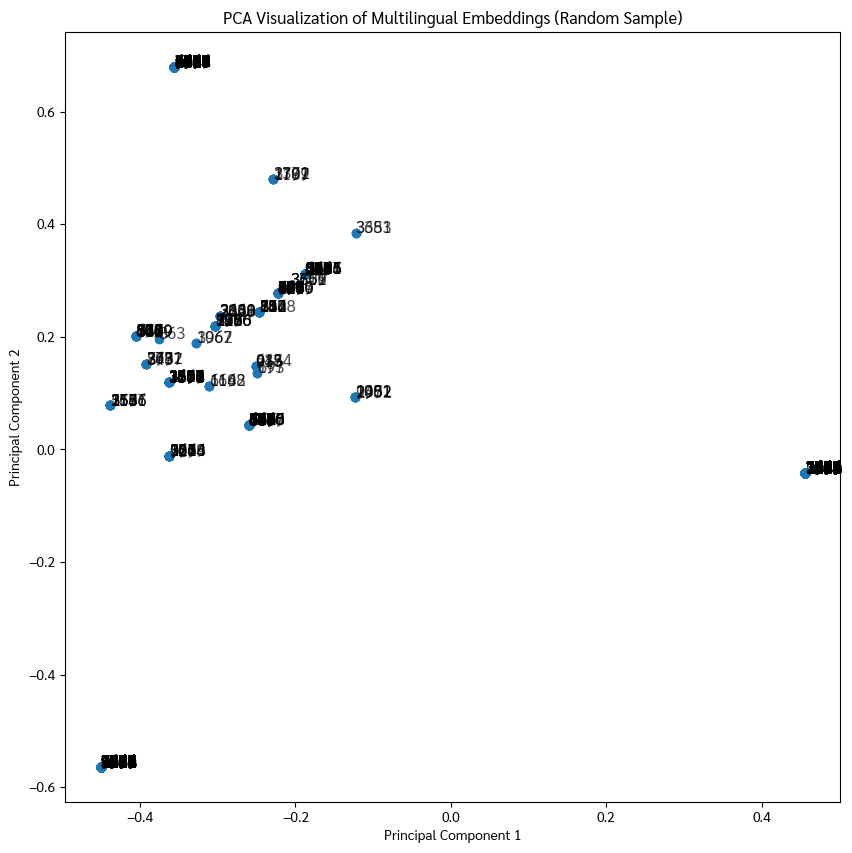

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import random

# Shuffle the titles and their corresponding embeddings
combined = list(zip(user_ids, titles_result))

random.shuffle(combined)
shuffled_user_ids, shuffled_titles_embeded,  = zip(*combined)
print(len(titles))
# Sample a random subset of titles (for example, 20 random titles)
num_samples = 1000
sampled_user_ids = shuffled_user_ids[:num_samples]
sampled_embeddings = shuffled_titles_embeded[:num_samples]

# Apply PCA to reduce dimensionality to 2 dimensions
pca = PCA(n_components=2)
pca_result = pca.fit_transform(sampled_embeddings)

# Create a scatter plot of the PCA results
plt.figure(figsize=(10, 10))  # Increase figure size

plt.scatter(pca_result[:, 0], pca_result[:, 1])

# Annotate the points with text labels
for i, label in enumerate(sampled_user_ids):
    plt.annotate(str(label), (pca_result[i, 0], pca_result[i, 1]), fontsize=12, alpha=0.7)  # Smaller font size and transparent background

plt.title("PCA Visualization of Multilingual Embeddings (Random Sample)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()



In [ ]:
grouped_df=grouped_df.reset_index()

In [ ]:
grouped_df

,index,user_id,title,joined_titles,embeded_title
0,0,1,[Relative-Motion Analysis using Rotating Axes:...,Relative-Motion Analysis using Rotating Axes: ...,"(tf.Tensor(-0.027242709, shape=(), dtype=float..."
1,1,3,[Thailand Smart Factory|Smart Factory คืออะไร?...,Thailand Smart Factory|Smart Factory คืออะไร? ...,"(tf.Tensor(-0.019321471, shape=(), dtype=float..."
2,2,5,[Software Development Life Cycle|Software Requ...,Software Development Life Cycle|Software Requi...,"(tf.Tensor(-0.07898392, shape=(), dtype=float3..."
3,3,7,[Coordinate Frame and Transformation (พิกัดเฟร...,Coordinate Frame and Transformation (พิกัดเฟรม...,"(tf.Tensor(-0.038853455, shape=(), dtype=float..."
4,4,12,[Industrial Sensors and Actuators - Encoders|I...,Industrial Sensors and Actuators - Encoders|In...,"(tf.Tensor(0.02023062, shape=(), dtype=float32..."
...,...,...,...,...,...
3243,3243,3774,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019695837, shape=(), dtype=float..."
3244,3244,3775,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019717524, shape=(), dtype=float..."
3245,3245,3776,"[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...",Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...,"(tf.Tensor(0.00093066966, shape=(), dtype=floa..."
3246,3246,3777,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.01969583, shape=(), dtype=float3..."


In [ ]:
grouped_df

,index,user_id,title,joined_titles,embeded_title,left_title,left_title_len,title_len,right_title,left_title_embeded,right_title_embeded,left_title_joined,right_title_joined
0,0,1,[Relative-Motion Analysis using Rotating Axes:...,Relative-Motion Analysis using Rotating Axes: ...,"(tf.Tensor(-0.027242709, shape=(), dtype=float...",[Relative-Motion Analysis using Rotating Axes:...,1,3,[Industrial Sensors and Actuators - Encoders|I...,"((tf.Tensor(-0.02722619, shape=(), dtype=float...","((tf.Tensor(0.020246029, shape=(), dtype=float...",Relative-Motion Analysis using Rotating Axes: ...,Industrial Sensors and Actuators - Encoders|In...
1,1,3,[Thailand Smart Factory|Smart Factory คืออะไร?...,Thailand Smart Factory|Smart Factory คืออะไร? ...,"(tf.Tensor(-0.019321471, shape=(), dtype=float...",[Thailand Smart Factory|Smart Factory คืออะไร?...,1,3,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,"((tf.Tensor(-0.019320296, shape=(), dtype=floa...","((tf.Tensor(-0.019723965, shape=(), dtype=floa...",Thailand Smart Factory|Smart Factory คืออะไร? ...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...
2,2,5,[Software Development Life Cycle|Software Requ...,Software Development Life Cycle|Software Requi...,"(tf.Tensor(-0.07898392, shape=(), dtype=float3...",[Software Development Life Cycle|Software Requ...,3,7,[Thailand Smart Factory|Smart Factory คืออะไร?...,"((tf.Tensor(-0.07899693, shape=(), dtype=float...","((tf.Tensor(-0.019326711, shape=(), dtype=floa...",Software Development Life Cycle|Software Requi...,Thailand Smart Factory|Smart Factory คืออะไร? ...
3,3,7,[Coordinate Frame and Transformation (พิกัดเฟร...,Coordinate Frame and Transformation (พิกัดเฟรม...,"(tf.Tensor(-0.038853455, shape=(), dtype=float...",[],0,1,[Coordinate Frame and Transformation (พิกัดเฟร...,(),"((tf.Tensor(-0.038853455, shape=(), dtype=floa...",,Coordinate Frame and Transformation (พิกัดเฟรม...
4,4,12,[Industrial Sensors and Actuators - Encoders|I...,Industrial Sensors and Actuators - Encoders|In...,"(tf.Tensor(0.02023062, shape=(), dtype=float32...",[Industrial Sensors and Actuators - Encoders|I...,4,8,"[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...","((tf.Tensor(0.020239007, shape=(), dtype=float...","((tf.Tensor(0.00093066966, shape=(), dtype=flo...",Industrial Sensors and Actuators - Encoders|In...,Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3243,3243,3774,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019695837, shape=(), dtype=float...",[],0,1,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,(),"((tf.Tensor(-0.019695843, shape=(), dtype=floa...",,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...
3244,3244,3775,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019717524, shape=(), dtype=float...",[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,1,2,[Coordinate Frame and Transformation (พิกัดเฟร...,"((tf.Tensor(-0.019695843, shape=(), dtype=floa...","((tf.Tensor(-0.038853455, shape=(), dtype=floa...",บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,Coordinate Frame and Transformation (พิกัดเฟรม...
3245,3245,3776,"[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...",Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...,"(tf.Tensor(0.00093066966, shape=(), dtype=floa...","[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...",2,5,[Relative-Motion Analysis using Rotating Axes:...,"((tf.Tensor(0.0009159526, shape=(), dtype=floa...","((tf.Tensor(-0.027239576, shape=(), dtype=floa...",Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...,Relative-Motion Analysis using Rotating Axes: ...
3246,3246,3777,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.01969583, shape=(), dtype=float3...",[],0,1,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,(),"((tf.Tensor(-0.01969583, shape=(), dtype=float...",,บริบทและความสำคัญขอ

In [ ]:
def get_half_left_of_list(list):
  """Gets the first half of the list."""
  half_length = len(list) // 2
  return list[:half_length]
grouped_df['left_title']=grouped_df['title'].apply(get_half_left_of_list)
grouped_df['left_title_len']=grouped_df['left_title'].apply(lambda x: len(x))
grouped_df['title_len']=grouped_df['title'].apply(lambda x: len(x))

In [ ]:
def get_half_right_of_list(list):
  """Gets the last half of the list."""
  half_length = len(list) // 2
  return list[half_length:]
grouped_df['right_title']=grouped_df['title'].apply(get_half_right_of_list)

In [ ]:
grouped_df['left_title_joined']=grouped_df['left_title'].apply(lambda x: '--'.join(x))
grouped_df['right_title_joined']=grouped_df['right_title'].apply(lambda x: '--'.join(x))

In [ ]:
def embed_title(title):
    return embed(title)
grouped_df['left_title_embeded'] = grouped_df['left_title_joined'].apply(embed_title)
grouped_df['right_title_embeded'] = grouped_df['right_title_joined'].apply(embed_title)

In [ ]:

grouped_df['left_title_embeded'] = grouped_df['left_title_embeded'].apply(lambda x: x[0])
grouped_df['right_title_embeded'] = grouped_df['right_title_embeded'].apply(lambda x: x[0])

In [ ]:
grouped_df

,index,user_id,title,joined_titles,embeded_title,left_title,left_title_len,title_len,right_title,left_title_embeded,right_title_embeded,left_title_joined,right_title_joined
0,0,1,[Relative-Motion Analysis using Rotating Axes:...,Relative-Motion Analysis using Rotating Axes: ...,"(tf.Tensor(-0.027242709, shape=(), dtype=float...",[Relative-Motion Analysis using Rotating Axes:...,1,3,[Industrial Sensors and Actuators - Encoders|I...,"(tf.Tensor(-0.027226185, shape=(), dtype=float...","(tf.Tensor(0.010675294, shape=(), dtype=float3...",Relative-Motion Analysis using Rotating Axes: ...,Industrial Sensors and Actuators - Encoders|In...
1,1,3,[Thailand Smart Factory|Smart Factory คืออะไร?...,Thailand Smart Factory|Smart Factory คืออะไร? ...,"(tf.Tensor(-0.019321471, shape=(), dtype=float...",[Thailand Smart Factory|Smart Factory คืออะไร?...,1,3,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,"(tf.Tensor(-0.019320304, shape=(), dtype=float...","(tf.Tensor(-0.04481983, shape=(), dtype=float3...",Thailand Smart Factory|Smart Factory คืออะไร? ...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...
2,2,5,[Software Development Life Cycle|Software Requ...,Software Development Life Cycle|Software Requi...,"(tf.Tensor(-0.07898392, shape=(), dtype=float3...",[Software Development Life Cycle|Software Requ...,3,7,[Thailand Smart Factory|Smart Factory คืออะไร?...,"(tf.Tensor(-0.038253065, shape=(), dtype=float...","(tf.Tensor(-0.05560231, shape=(), dtype=float3...",Software Development Life Cycle|Software Requi...,Thailand Smart Factory|Smart Factory คืออะไร? ...
3,3,7,[Coordinate Frame and Transformation (พิกัดเฟร...,Coordinate Frame and Transformation (พิกัดเฟรม...,"(tf.Tensor(-0.038853455, shape=(), dtype=float...",[],0,1,[Coordinate Frame and Transformation (พิกัดเฟร...,"(tf.Tensor(0.009676654, shape=(), dtype=float3...","(tf.Tensor(-0.038853444, shape=(), dtype=float...",,Coordinate Frame and Transformation (พิกัดเฟรม...
4,4,12,[Industrial Sensors and Actuators - Encoders|I...,Industrial Sensors and Actuators - Encoders|In...,"(tf.Tensor(0.02023062, shape=(), dtype=float32...",[Industrial Sensors and Actuators - Encoders|I...,4,8,"[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...","(tf.Tensor(-0.04454406, shape=(), dtype=float3...","(tf.Tensor(-0.013472811, shape=(), dtype=float...",Industrial Sensors and Actuators - Encoders|In...,Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3243,3243,3774,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019695837, shape=(), dtype=float...",[],0,1,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,"(tf.Tensor(0.009676654, shape=(), dtype=float3...","(tf.Tensor(-0.019695839, shape=(), dtype=float...",,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...
3244,3244,3775,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019717524, shape=(), dtype=float...",[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,1,2,[Coordinate Frame and Transformation (พิกัดเฟร...,"(tf.Tensor(-0.019695839, shape=(), dtype=float...","(tf.Tensor(-0.038853455, shape=(), dtype=float...",บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,Coordinate Frame and Transformation (พิกัดเฟรม...
3245,3245,3776,"[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...",Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...,"(tf.Tensor(0.00093066966, shape=(), dtype=floa...","[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...",2,5,[Relative-Motion Analysis using Rotating Axes:...,"(tf.Tensor(-0.0010153411, shape=(), dtype=floa...","(tf.Tensor(-0.0020225404, shape=(), dtype=floa...",Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...,Relative-Motion Analysis using Rotating Axes: ...
3246,3246,3777,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.01969583, shape=(), dtype=float3...",[],0,1,[บริบทและความสำคัญของหุ่นยน

In [ ]:
# merged_df
# grouped_df = merged_df.groupby('user_id')['embeded_title'].sum()

In [ ]:
# for name, group in grouped_df:
#   print(name,group)

In [ ]:
# This install was suggested by an error message generated when I did the earlier imports.   Apparently one of the
# packages was not compatible with the newer version of folium.
!pip install folium==0.2.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.0/70.0 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for folium: filename=folium-0.2.1-py3-none-any.whl size=79793 sha256=288ae0850a8ffe384c6968a5a4eecb84405d62d41fcd46e0f9167a6002c61dfc
  Stored in directory: /root/.cache/pip/wheels/00/0c/07/d7792a5444d5bb074361ac27da53cee9d5cce59a07fe9da5dd
Successfully built folium
  Attempting uninstall: folium
    Found existing installation: folium 0.14.0
    Uninstalling folium-0.14.0:
      Successfully uninstalled folium-0.14.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datascience 0.17.6 requires folium>=0.9.1, but you have folium 0.2.1 which is incompatible.
geemap 0.26.0 requires folium>=0.13.0, but you have folium 0.2.1 which is incompatible.


In [ ]:
!pip install -q torchdata==0.3.0 torchtext==0.12 spacy==3.2 altair GPUtil
# For new language translation will need to download vocabulary.
# Note that I have used two different sources.
!python -m spacy download de_core_news_sm
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 25.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 93.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.6/750.6 MB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 659.5/659.5 kB 52.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 14.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
en-core-web-sm 3.6.0 requires spacy<3.7.0,>=3.6.0, but you have spacy 3.2.0 which is incompatible.
inflect 7.0.0 requires pydantic>=1.9.1, but you have pydantic 1.8.2 which is incompatible.
torchaudio 2.0.2+cu118 requires torch==2.0.1, but you have torch 1.11.0 which is incompatible.
torchvision 0.15

In [ ]:
import os
from os.path import exists
import torch
import torch.nn as nn
from torch.nn.functional import log_softmax, pad
# See: https://pytorch.org/docs/stable/generated/torch.nn.Linear.html
# See: https://pytorch.org/docs/stable/generated/torch.nn.functional.pad.html
import math
import copy
import time
from torch.optim.lr_scheduler import LambdaLR
import pandas as pd
import altair as alt
from torchtext.data.functional import to_map_style_dataset
from torch.utils.data import DataLoader
from torchtext.vocab import build_vocab_from_iterator
import torchtext.datasets as datasets
import spacy
import GPUtil
import warnings
from torch.utils.data.distributed import DistributedSampler
import torch.distributed as dist
import torch.multiprocessing as mp
from torch.nn.parallel import DistributedDataParallel as DDP


# Set to False to skip notebook execution (e.g. for debugging)
warnings.filterwarnings("ignore")
RUN_EXAMPLES = True

In [ ]:
# Some convenience helper functions used throughout the notebook


def is_interactive_notebook():
    return __name__ == "__main__"


def show_example(fn, args=[]):
    if __name__ == "__main__" and RUN_EXAMPLES:
        return fn(*args)


def execute_example(fn, args=[]):
    if __name__ == "__main__" and RUN_EXAMPLES:
        fn(*args)


class DummyOptimizer(torch.optim.Optimizer):
    def __init__(self):
        self.param_groups = [{"lr": 0}]
        None

    def step(self):
        None

    def zero_grad(self, set_to_none=False):
        None


class DummyScheduler:
    def step(self):
        None

# From Section:  Background
These comments are from the original paper:  [Attention is All You Need](https://arxiv.org/pdf/1706.03762.pdf)
"In these models, the number of operations required to relate signals from two arbitrary input or output positions grows in the distance between positions, linearly for ConvS2S and logarithmically for ByteNet. This makes it more difficult to learn dependencies between distant positions. In the Transformer this is reduced to a constant number of operations, albeit at the cost of reduced effective resolution due to averaging attention-weighted positions, an effect we counteract with Multi-Head Attention."

"Self-attention, sometimes called intra-attention is an attention mechanism relating different positions of a single sequence in order to compute a representation of the sequence."

"To the best of our knowledge, however, the Transformer is the first transduction model relying entirely on self-attention to compute representations of its input and output without using sequence aligned RNNs or convolution."

# From Section:  Model Architecture
"Most competitive neural sequence transduction models have an encoder-decoder structure (cite). Here, the encoder maps an input sequence of symbol representations $(x_1, ..., x_n)$ to a sequence of continuous representations $\mathbf{z} = (z_1, ..., z_n)$. Given $\mathbf{z}$, the decoder then generates an output sequence $(y_1,...,y_m)$ of symbols one element at a time. At each step the model is auto-regressive (cite), consuming the previously generated symbols as additional input when generating the next."

# Example code illustrating Softmax and Logsoftmax.

See [Softmax vs LogSoftMax]("https://medium.com/@AbhiramiVS/softmax-vs-logsoftmax-eb94254445a2").

In [ ]:
grouped_df
left_title_embeded_list=grouped_df['left_title_embeded'].tolist()
right_title_embeded_list=grouped_df['right_title_embeded'].tolist()

In [ ]:
type(left_title_embeded_list[0])

tensorflow.python.framework.ops.EagerTensor

In [ ]:
left_title_embeded_list = [item.numpy() for item in left_title_embeded_list]
right_title_embeded_list = [item.numpy() for item in right_title_embeded_list]

In [ ]:
left_title_joined=grouped_df['left_title_joined'].tolist()
right_title_joined=grouped_df['right_title_joined'].tolist()

In [ ]:
!pip install torchtext

In [ ]:
char_arr = [c for c in 'SEPabcdefghijklmnopqrstuvwxyz']
num_dic = {n: i for i, n in enumerate(char_arr)}

In [ ]:
import math
import torch
import random
from torch import nn
from torch.autograd import Variable
import torch.nn.functional as F


class Encoder(nn.Module):
    def __init__(self, input_size, embed_size, hidden_size,
                 n_layers=1, dropout=0.5):
        super(Encoder, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.embed_size = embed_size
        self.embed = nn.Embedding(input_size, embed_size)
        self.gru = nn.GRU(embed_size, hidden_size, n_layers,
                          dropout=dropout, bidirectional=True)

    def forward(self, src, hidden=None):
        embedded = self.embed(src)
        outputs, hidden = self.gru(embedded, hidden)
        # sum bidirectional outputs
        outputs = (outputs[:, :, :self.hidden_size] +
                   outputs[:, :, self.hidden_size:])
        return outputs, hidden


class Attention(nn.Module):
    def __init__(self, hidden_size):
        super(Attention, self).__init__()
        self.hidden_size = hidden_size
        self.attn = nn.Linear(self.hidden_size * 2, hidden_size)
        self.v = nn.Parameter(torch.rand(hidden_size))
        stdv = 1. / math.sqrt(self.v.size(0))
        self.v.data.uniform_(-stdv, stdv)

    def forward(self, hidden, encoder_outputs):
        timestep = encoder_outputs.size(0)
        h = hidden.repeat(timestep, 1, 1).transpose(0, 1)
        encoder_outputs = encoder_outputs.transpose(0, 1)  # [B*T*H]
        attn_energies = self.score(h, encoder_outputs)
        return F.softmax(attn_energies, dim=1).unsqueeze(1)

    def score(self, hidden, encoder_outputs):
        # [B*T*2H]->[B*T*H]
        energy = F.relu(self.attn(torch.cat([hidden, encoder_outputs], 2)))
        energy = energy.transpose(1, 2)  # [B*H*T]
        v = self.v.repeat(encoder_outputs.size(0), 1).unsqueeze(1)  # [B*1*H]
        energy = torch.bmm(v, energy)  # [B*1*T]
        return energy.squeeze(1)  # [B*T]


class Decoder(nn.Module):
    def __init__(self, embed_size, hidden_size, output_size,
                 n_layers=1, dropout=0.2):
        super(Decoder, self).__init__()
        self.embed_size = embed_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.n_layers = n_layers

        self.embed = nn.Embedding(output_size, embed_size)
        self.dropout = nn.Dropout(dropout, inplace=True)
        self.attention = Attention(hidden_size)
        self.gru = nn.GRU(hidden_size + embed_size, hidden_size,
                          n_layers, dropout=dropout)
        self.out = nn.Linear(hidden_size * 2, output_size)

    def forward(self, input, last_hidden, encoder_outputs):
        # Get the embedding of the current input word (last output word)
        embedded = self.embed(input).unsqueeze(0)  # (1,B,N)
        embedded = self.dropout(embedded)
        # Calculate attention weights and apply to encoder outputs
        attn_weights = self.attention(last_hidden[-1], encoder_outputs)
        context = attn_weights.bmm(encoder_outputs.transpose(0, 1))  # (B,1,N)
        context = context.transpose(0, 1)  # (1,B,N)
        # Combine embedded input word and attended context, run through RNN
        rnn_input = torch.cat([embedded, context], 2)
        output, hidden = self.gru(rnn_input, last_hidden)
        output = output.squeeze(0)  # (1,B,N) -> (B,N)
        context = context.squeeze(0)
        output = self.out(torch.cat([output, context], 1))
        output = F.log_softmax(output, dim=1)
        return output, hidden, attn_weights


class Seq2Seq(nn.Module):
    def __init__(self, encoder, decoder):
        super(Seq2Seq, self).__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, src, trg, teacher_forcing_ratio=0.5):
        batch_size = src.size(1)
        max_len = trg.size(0)
        vocab_size = self.decoder.output_size
        outputs = Variable(torch.zeros(max_len, batch_size, vocab_size)).cuda()

        encoder_output, hidden = self.encoder(src)
        hidden = hidden[:self.decoder.n_layers]
        output = Variable(trg.data[0, :])  # sos
        for t in range(1, max_len):
            output, hidden, attn_weights = self.decoder(
                    output, hidden, encoder_output)
            outputs[t] = output
            is_teacher = random.random() < teacher_forcing_ratio
            top1 = output.data.max(1)[1]
            output = Variable(trg.data[t] if is_teacher else top1).cuda()
        return outputs

In [ ]:
!python -m spacy download de
!python -m spacy download en

⚠ As of spaCy v3.0, shortcuts like 'de' are deprecated. Please use the
full pipeline package name 'de_core_news_sm' instead.
DEPRECATION: https://github.com/explosion/spacy-models/releases/download/de_core_news_sm-3.2.0/de_core_news_sm-3.2.0-py3-none-any.whl#egg=de_core_news_sm==3.2.0 contains an egg fragment with a non-PEP 508 name pip 25.0 will enforce this behaviour change. A possible replacement is to use the req @ url syntax, and remove the egg fragment. Discussion can be found at https://github.com/pypa/pip/issues/11617
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 18.1 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('de_core_news_sm')
⚠ As of spaCy v3.0, shortcuts like 'en' are deprecated. Please use the
full pipeline package name 'en_core_web_sm' instead.
DEPRECATION: https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.2.0/en_core_web_sm-3.2.0-py3-none-any.whl#egg=en_core_web_sm==3.2.0 con

In [ ]:
import re
import spacy
from torchtext.data import Field, BucketIterator
from torchtext.datasets import Multi30k


def load_dataset(batch_size):
    spacy_de = spacy.load('de')
    spacy_en = spacy.load('en')
    url = re.compile('(<url>.*</url>)')

    def tokenize_de(text):
        return [tok.text for tok in spacy_de.tokenizer(url.sub('@URL@', text))]

    def tokenize_en(text):
        return [tok.text for tok in spacy_en.tokenizer(url.sub('@URL@', text))]

    DE = Field(tokenize=tokenize_de, include_lengths=True,
               init_token='<sos>', eos_token='<eos>')
    EN = Field(tokenize=tokenize_en, include_lengths=True,
               init_token='<sos>', eos_token='<eos>')
    train, val, test = Multi30k.splits(exts=('.de', '.en'), fields=(DE, EN))
    DE.build_vocab(train.src, min_freq=2)
    EN.build_vocab(train.trg, max_size=10000)
    train_iter, val_iter, test_iter = BucketIterator.splits(
            (train, val, test), batch_size=batch_size, repeat=False)
    return train_iter, val_iter, test_iter, DE, EN

ImportError: ignored

In [ ]:
import os
import math
import argparse
import torch
from torch import optim
from torch.autograd import Variable
from torch.nn.utils import clip_grad_norm_
from torch.nn import functional as F
# from model import Encoder, Decoder, Seq2Seq
from utils import load_dataset


def parse_arguments():
    p = argparse.ArgumentParser(description='Hyperparams')
    p.add_argument('-epochs', type=int, default=100,
                   help='number of epochs for train')
    p.add_argument('-batch_size', type=int, default=32,
                   help='number of epochs for train')
    p.add_argument('-lr', type=float, default=0.0001,
                   help='initial learning rate')
    p.add_argument('-grad_clip', type=float, default=10.0,
                   help='in case of gradient explosion')
    return p.parse_args()


def evaluate(model, val_iter, vocab_size, DE, EN):
    with torch.no_grad():
        model.eval()
        pad = EN.vocab.stoi['<pad>']
        total_loss = 0
        for b, batch in enumerate(val_iter):
            src, len_src = batch.src
            trg, len_trg = batch.trg
            src = src.data.cuda()
            trg = trg.data.cuda()
            output = model(src, trg, teacher_forcing_ratio=0.0)
            loss = F.nll_loss(output[1:].view(-1, vocab_size),
                                   trg[1:].contiguous().view(-1),
                                   ignore_index=pad)
            total_loss += loss.data.item()
        return total_loss / len(val_iter)


def train(e, model, optimizer, train_iter, vocab_size, grad_clip, DE, EN):
    model.train()
    total_loss = 0
    pad = EN.vocab.stoi['<pad>']
    for b, batch in enumerate(train_iter):
        src, len_src = batch.src
        trg, len_trg = batch.trg
        src, trg = src.cuda(), trg.cuda()
        optimizer.zero_grad()
        output = model(src, trg)
        loss = F.nll_loss(output[1:].view(-1, vocab_size),
                               trg[1:].contiguous().view(-1),
                               ignore_index=pad)
        loss.backward()
        clip_grad_norm_(model.parameters(), grad_clip)
        optimizer.step()
        total_loss += loss.data.item()

        if b % 100 == 0 and b != 0:
            total_loss = total_loss / 100
            print("[%d][loss:%5.2f][pp:%5.2f]" %
                  (b, total_loss, math.exp(total_loss)))
            total_loss = 0


def main():
    args = parse_arguments()
    hidden_size = 512
    embed_size = 256
    assert torch.cuda.is_available()

    print("[!] preparing dataset...")
    train_iter, val_iter, test_iter, DE, EN = load_dataset(args.batch_size)
    de_size, en_size = len(DE.vocab), len(EN.vocab)
    print("[TRAIN]:%d (dataset:%d)\t[TEST]:%d (dataset:%d)"
          % (len(train_iter), len(train_iter.dataset),
             len(test_iter), len(test_iter.dataset)))
    print("[DE_vocab]:%d [en_vocab]:%d" % (de_size, en_size))

    print("[!] Instantiating models...")
    encoder = Encoder(de_size, embed_size, hidden_size,
                      n_layers=2, dropout=0.5)
    decoder = Decoder(embed_size, hidden_size, en_size,
                      n_layers=1, dropout=0.5)
    seq2seq = Seq2Seq(encoder, decoder).cuda()
    optimizer = optim.Adam(seq2seq.parameters(), lr=args.lr)
    print(seq2seq)

    best_val_loss = None
    for e in range(1, args.epochs+1):
        train(e, seq2seq, optimizer, train_iter,
              en_size, args.grad_clip, DE, EN)
        val_loss = evaluate(seq2seq, val_iter, en_size, DE, EN)
        print("[Epoch:%d] val_loss:%5.3f | val_pp:%5.2fS"
              % (e, val_loss, math.exp(val_loss)))

        # Save the model if the validation loss is the best we've seen so far.
        if not best_val_loss or val_loss < best_val_loss:
            print("[!] saving model...")
            if not os.path.isdir(".save"):
                os.makedirs(".save")
            torch.save(seq2seq.state_dict(), './.save/seq2seq_%d.pt' % (e))
            best_val_loss = val_loss
    test_loss = evaluate(seq2seq, test_iter, en_size, DE, EN)
    print("[TEST] loss:%5.2f" % test_loss)


if __name__ == "__main__":
    try:
        main()
    except KeyboardInterrupt as e:
        print("[STOP]", e)

ModuleNotFoundError: ignored

In [ ]:
torch_tensor = torch.tensor(left_title_embeded_list)

In [ ]:
input = torch_tensor
print(type(input))
print(f"input = {input}")
SM = nn.Softmax(dim=1)
LSM = nn.LogSoftmax(dim=1)
print(f"Softmax(input) = {SM(input)}") # We calculuate the softmax with the nn library function.
print(f"LogSoftmax(input) = {LSM(input)}")
print(f"Log(Softmax)) = {torch.log(SM(input))}") # We use the torch.log function to take the log of the matrix.


<class 'torch.Tensor'>
input = tensor([[-0.0272, -0.0358,  0.0748,  ...,  0.0235,  0.0242,  0.0042],
        [-0.0193, -0.0427,  0.0357,  ..., -0.0092, -0.0997, -0.0488],
        [-0.0383,  0.0551,  0.0624,  ...,  0.0456, -0.0524,  0.0602],
        ...,
        [-0.0010,  0.0350,  0.0304,  ..., -0.0169,  0.0169,  0.0490],
        [ 0.0097, -0.0255, -0.0317,  ..., -0.0171,  0.0298, -0.0317],
        [ 0.0316, -0.0001, -0.0136,  ..., -0.0414,  0.0134,  0.0242]])
Softmax(input) = tensor([[0.0019, 0.0019, 0.0021,  ..., 0.0020, 0.0020, 0.0020],
        [0.0019, 0.0019, 0.0020,  ..., 0.0019, 0.0018, 0.0019],
        [0.0019, 0.0021, 0.0021,  ..., 0.0020, 0.0019, 0.0021],
        ...,
        [0.0020, 0.0020, 0.0020,  ..., 0.0019, 0.0020, 0.0021],
        [0.0020, 0.0019, 0.0019,  ..., 0.0019, 0.0020, 0.0019],
        [0.0020, 0.0019, 0.0019,  ..., 0.0019, 0.0020, 0.0020]])
LogSoftmax(input) = tensor([[-6.2656, -6.2742, -6.1636,  ..., -6.2149, -6.2142, -6.2342],
        [-6.2565, -6.2799, -6.

# Example code illustrating the Linear class (my notes)
See: https://pytorch.org/docs/stable/generated/torch.nn.Linear.html
This code illustrates how nn.Linear works.   The example code applies a linear transformation to the input data (input) in several different ways.  We start by using nn.Linear to generate a random initialization of the weight and bias.

Then we check by using the weight and bias methods of nn.Linear to access the values from the initialization and recompute the output matrix (new_output) using matrix operations.  Then we adjust the weight and bias, apply linear again, and check.  Finally, we do the last computation again using the forward method.

In [ ]:
import numpy as np




In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
# print(left_title_embeded_list)
# Generate some random training data (replace this with your actual data)
# X_train = np.random.rand(1000, 512)
# y_train = np.random.rand(1000, 512)
X_train2= np.array(left_title_embeded_list)
y_train2= np.array(right_title_embeded_list)

# Assuming you have X_train2 and y_train2 from your code
# Split the data into training and test sets (e.g., 80% training, 20% testing)
split_ratio = 0.8
split_index = int(len(X_train2) * split_ratio)

X_train_split = X_train2[:split_index]
y_train_split = y_train2[:split_index]
X_test_split = X_train2[split_index:]
y_test_split = y_train2[split_index:]

# print(X_train)
print(X_train2)
# Build a simple neural network
model = keras.Sequential([
    keras.layers.Dense(512, activation='relu', input_shape=(512,)),
    keras.layers.Dense(512)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model on the training data
epochs = 50
batch_size = 32
model.fit(X_train_split, y_train_split, epochs=epochs, batch_size=batch_size)

# Test the model on the test data
y_pred_split = model.predict(X_test_split)

# Test the model (replace X_test with your test data)
X_test = np.random.rand(100, 512)
y_pred = model.predict(X_test)


[[-0.02722619 -0.03583407  0.07484482 ...  0.02348035  0.02416528
   0.00422771]
 [-0.0193203  -0.04273658  0.03571781 ... -0.00919366 -0.09973524
  -0.04880435]
 [-0.03825307  0.05510694  0.06236481 ...  0.04563195 -0.05243224
   0.06019454]
 ...
 [-0.00101534  0.03503109  0.03041965 ... -0.01689745  0.01686627
   0.04904829]
 [ 0.00967665 -0.02545053 -0.03171456 ... -0.01711628  0.02975433
  -0.03169921]
 [ 0.03161192 -0.00014036 -0.01358743 ... -0.04135641  0.01342293
   0.02415581]]
Epoch 1/50
82/82 [==============================] - 1s 2ms/step - loss: 0.0010
Epoch 2/50
82/82 [==============================] - 0s 2ms/step - loss: 9.2208e-04
Epoch 3/50
82/82 [==============================] - 0s 2ms/step - loss: 9.1566e-04
Epoch 4/50
82/82 [==============================] - 0s 2ms/step - loss: 9.0287e-04
Epoch 5/50
82/82 [==============================] - 0s 2ms/step - loss: 9.0389e-04
Epoch 6/50
82/82 [==============================] - 0s 2ms/step - loss: 8.9969e-04
Epoch 7/50
82/

3248
21/21 [==============================] - 0s 1ms/step


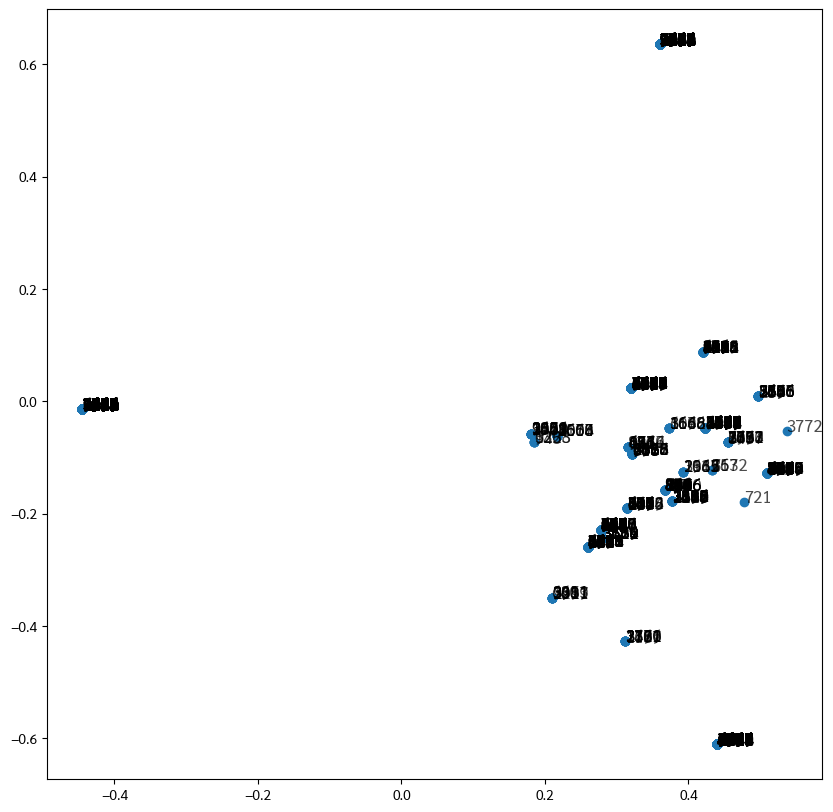

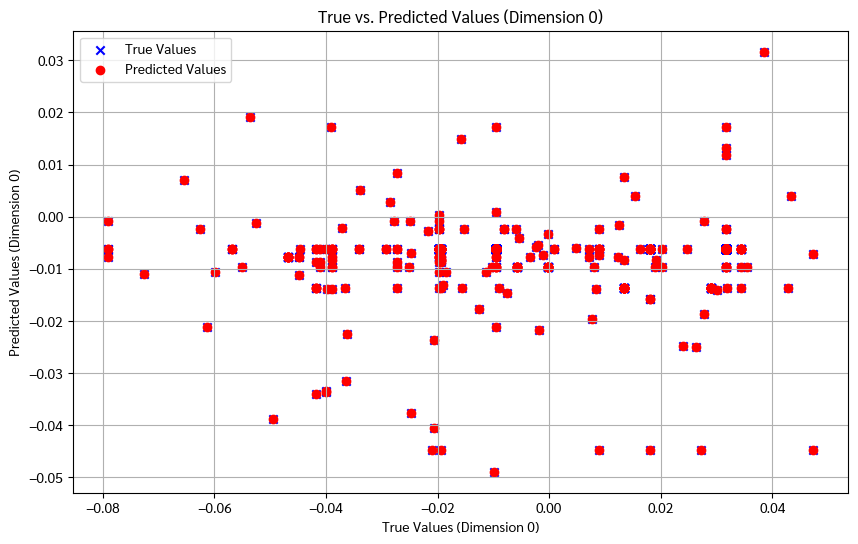

In [ ]:
import matplotlib.pyplot as plt

# Make predictions on the test data
y_pred_split = model.predict(X_test_split)

# Choose a dimension (e.g., dimension 0) to visualize
dim_to_visualize = 0

# Plot the true values as 'x' markers and predicted values as 'o' markers
plt.figure(figsize=(10, 6))
plt.scatter(
    y_test_split[:, dim_to_visualize],  # True values on x-axis
    y_pred_split[:, dim_to_visualize],  # Predicted values on y-axis
    c='b',  # Color of the markers
    marker='x',  # Use 'x' for true values
    label='True Values'
)
plt.scatter(
    y_test_split[:, dim_to_visualize],  # True values on x-axis (again)
    y_pred_split[:, dim_to_visualize],  # Predicted values on y-axis (again)
    c='r',  # Color of the markers
    marker='o',  # Use 'o' for predicted values
    label='Predicted Values'
)

plt.xlabel(f'True Values (Dimension {dim_to_visualize})')
plt.ylabel(f'Predicted Values (Dimension {dim_to_visualize})')
plt.title(f'True vs. Predicted Values (Dimension {dim_to_visualize})')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
y_pred = model.predict(X_test)
print(y_pred)

4/4 [==============================] - 0s 2ms/step
[[ 0.21769993  0.37928194  0.43757853 ... -0.4810183  -0.9718698
  -0.68797684]
 [-0.15340234  0.40876868  1.01781    ... -0.2279669  -0.12339906
  -0.42131647]
 [-0.24532717  0.42171046  0.92502517 ... -0.09018805 -0.30259404
   0.03126875]
 ...
 [-0.13772114  0.12469703  1.0626843  ... -0.08494164 -0.19384761
   0.18895663]
 [-0.41734266  0.33243653  0.871276   ... -0.02612003 -0.33639362
  -0.39804417]
 [-0.40393746  0.7698502   0.98211974 ... -0.02055392  0.25721604
   0.18532796]]


In [ ]:
grouped_df

,index,user_id,title,joined_titles,embeded_title,left_title,left_title_len,title_len,right_title,left_title_embeded,right_title_embeded,left_title_joined,right_title_joined
0,0,1,[Relative-Motion Analysis using Rotating Axes:...,Relative-Motion Analysis using Rotating Axes: ...,"(tf.Tensor(-0.027242709, shape=(), dtype=float...",[Relative-Motion Analysis using Rotating Axes:...,1,3,[Industrial Sensors and Actuators - Encoders|I...,"(tf.Tensor(-0.027226185, shape=(), dtype=float...","(tf.Tensor(0.010675294, shape=(), dtype=float3...",Relative-Motion Analysis using Rotating Axes: ...,Industrial Sensors and Actuators - Encoders|In...
1,1,3,[Thailand Smart Factory|Smart Factory คืออะไร?...,Thailand Smart Factory|Smart Factory คืออะไร? ...,"(tf.Tensor(-0.019321471, shape=(), dtype=float...",[Thailand Smart Factory|Smart Factory คืออะไร?...,1,3,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,"(tf.Tensor(-0.019320304, shape=(), dtype=float...","(tf.Tensor(-0.04481983, shape=(), dtype=float3...",Thailand Smart Factory|Smart Factory คืออะไร? ...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...
2,2,5,[Software Development Life Cycle|Software Requ...,Software Development Life Cycle|Software Requi...,"(tf.Tensor(-0.07898392, shape=(), dtype=float3...",[Software Development Life Cycle|Software Requ...,3,7,[Thailand Smart Factory|Smart Factory คืออะไร?...,"(tf.Tensor(-0.038253065, shape=(), dtype=float...","(tf.Tensor(-0.05560231, shape=(), dtype=float3...",Software Development Life Cycle|Software Requi...,Thailand Smart Factory|Smart Factory คืออะไร? ...
3,3,7,[Coordinate Frame and Transformation (พิกัดเฟร...,Coordinate Frame and Transformation (พิกัดเฟรม...,"(tf.Tensor(-0.038853455, shape=(), dtype=float...",[],0,1,[Coordinate Frame and Transformation (พิกัดเฟร...,"(tf.Tensor(0.009676654, shape=(), dtype=float3...","(tf.Tensor(-0.038853444, shape=(), dtype=float...",,Coordinate Frame and Transformation (พิกัดเฟรม...
4,4,12,[Industrial Sensors and Actuators - Encoders|I...,Industrial Sensors and Actuators - Encoders|In...,"(tf.Tensor(0.02023062, shape=(), dtype=float32...",[Industrial Sensors and Actuators - Encoders|I...,4,8,"[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...","(tf.Tensor(-0.04454406, shape=(), dtype=float3...","(tf.Tensor(-0.013472811, shape=(), dtype=float...",Industrial Sensors and Actuators - Encoders|In...,Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3243,3243,3774,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019695837, shape=(), dtype=float...",[],0,1,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,"(tf.Tensor(0.009676654, shape=(), dtype=float3...","(tf.Tensor(-0.019695839, shape=(), dtype=float...",,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...
3244,3244,3775,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019717524, shape=(), dtype=float...",[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,1,2,[Coordinate Frame and Transformation (พิกัดเฟร...,"(tf.Tensor(-0.019695839, shape=(), dtype=float...","(tf.Tensor(-0.038853455, shape=(), dtype=float...",บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,Coordinate Frame and Transformation (พิกัดเฟรม...
3245,3245,3776,"[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...",Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...,"(tf.Tensor(0.00093066966, shape=(), dtype=floa...","[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...",2,5,[Relative-Motion Analysis using Rotating Axes:...,"(tf.Tensor(-0.0010153411, shape=(), dtype=floa...","(tf.Tensor(-0.0020225404, shape=(), dtype=floa...",Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...,Relative-Motion Analysis using Rotating Axes: ...
3246,3246,3777,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.01969583, shape=(), dtype=float3...",[],0,1,[บริบทและความสำคัญของหุ่นยน

In [ ]:
lis
list_text_input=['Relative-Motion Analysis using Rotating Axes']
y_pred_manual = model.predict(embed(list_text_input))
y_pred = model.predict(X_test)
print(y_pred_manual)

In [ ]:
# plot(print(y_pred_manual))

3248


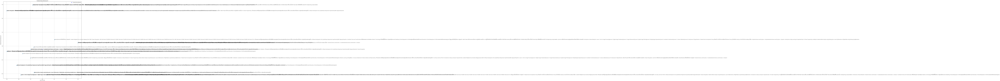

In [ ]:
import matplotlib.pyplot as plt


import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import random

# Shuffle the titles and their corresponding embeddings
combined = list(zip(titles, titles_result))
# random.shuffle(combined)
shuffled_titles, shuffled_embeddings = zip(*combined)
print(len(titles))
# Sample a random subset of titles (for example, 20 random titles)
num_samples = 100
sampled_titles = shuffled_titles[:num_samples]
sampled_embeddings = shuffled_embeddings[:num_samples]

# Apply PCA to reduce dimensionality to 2 dimensions
pca = PCA(n_components=2)
pca_result = pca.fit_transform(sampled_embeddings)
plt.figure(figsize=(20, 20))
# Create a scatter plot of the PCA results
# plt.figure(figsize=(10, 10))  # Increase figure size

plt.scatter(pca_result[:, 0], pca_result[:, 1])

# Annotate the points with text labels
for i, label in enumerate(sampled_titles):
    plt.annotate(sampled_titles[i], (pca_result[i, 0], pca_result[i, 1]), fontsize=12, alpha=0.7)  # Smaller font size and transparent background


# Assuming you have already calculated y_pred_manual
# y_pred_manual = model.predict(embed(['Relative-Motion Analysis using Rotating Axes']))

# Choose a dimension (e.g., dimension 0) to visualize
dim_to_visualize = 0

# Plot the predicted values in 2D

plt.scatter(
    range(len(y_pred_manual)),  # X-axis values (indices)
    y_pred_manual[:, dim_to_visualize],  # Predicted values for the chosen dimension
    c='b',  # Color of the markers
    marker='o',  # Use 'o' marker
    label='Predicted Values (Manual)'
)

plt.xlabel('Data Point Index')
plt.ylabel(f'Predicted Values (Dimension {dim_to_visualize})')
plt.title(f'Predicted Values (Dimension {dim_to_visualize})')
plt.legend()
plt.grid(True)
plt.show()


In [267]:
new_titles=[]
titles=grouped_df['title'].tolist()
for sublist in titles:
    for title in sublist:
      splited_titles=title.split('|')
      for splited_title in splited_titles:
        new_titles.append(splited_title)
# new_titles=new_titles.unique()
# print(len(new_titles))
unique_titles_set = set(new_titles)
unique_titles_list = list(unique_titles_set)
# print(len(unique_titles_list))
unique_titles_embeded_list=embed(unique_titles_list)
# print('unique_titles_list',unique_titles_list)

In [224]:
predict_embeded_titles = []
# for unique_titles in unique_titles_list:
predict_embeded_titles=(model.predict(unique_titles_embeded_list))

predict_embeded_titles.shape

4/4 [==============================] - 0s 2ms/step


(100, 512)

In [225]:
output_df = pd.DataFrame()
data = {'before': [],
        'after': []}
for i,unique_title in enumerate(unique_titles_list):
  print('unique_title',unique_title)
  target_vector=predict_embeded_titles[i]
  print('target_vector',target_vector.shape)

  # Calculate the Euclidean distance between the target vector and each vector in the list
  distances = [np.linalg.norm(target_vector - vec) for vec in (unique_titles_embeded_list)]
  # Find the index of the nearest vector
  nearest_index = np.argmin(distances)
  print('nearest_index',nearest_index)
  # print(titles)
  # Get the nearest vector
  # nearest_vector = unique_titles_embeded_list[nearest_index]
  data['before'].append(unique_titles_list[i])
  data['after'].append(unique_titles_list[nearest_index])
  # print("Nearest Vector:", unique_titles_list[nearest_index])
output_df = pd.DataFrame(data)

unique_title Forward Kinematics of Serial Manipulators (การคำนวนจลนศาสตร์ของแขนกลอนุกรม)
target_vector (512,)
nearest_index 55
unique_title FIBO Talk Series EP.9
target_vector (512,)
nearest_index 50
unique_title FIBO talk series EP.28
target_vector (512,)
nearest_index 50
unique_title FIBO Talk Series EP. Special 2
target_vector (512,)
nearest_index 50
unique_title วิทยาการหุ่นยนต์เบื้องต้น
target_vector (512,)
nearest_index 55
unique_title FIBO talk series EP.27
target_vector (512,)
nearest_index 50
unique_title FIBO Talk Series EP.4
target_vector (512,)
nearest_index 50
unique_title FIBO Talk Series EP.37-2
target_vector (512,)
nearest_index 50
unique_title FIBO Talk Series EP.31-1
target_vector (512,)
nearest_index 50
unique_title FIBO Talk Series EP.34-1
target_vector (512,)
nearest_index 50
unique_title FIBO Talk Series EP.8
target_vector (512,)
nearest_index 50
unique_title FIBO Talk Series EP.30
target_vector (512,)
nearest_index 50
unique_title You Only Look Once (YOLO)
target

In [217]:
output=model.predict([embed('Ordinary Differential Equations')])
target_vector=output
# print(target_vector)

# Calculate the Euclidean distance between the target vector and each vector in the list
distances = [np.linalg.norm(target_vector - vec) for vec in (unique_titles_embeded_list)]
# Find the index of the nearest vector
nearest_index = np.argmin(distances)

print(unique_titles_list[nearest_index])

1/1 [==============================] - 0s 20ms/step
Kinematic Modelling of Serial Manipulator (การจำลองหุ่นยนต์เชิงจลนศาสตร์)


In [226]:
output_df.to_csv('output_df.csv')

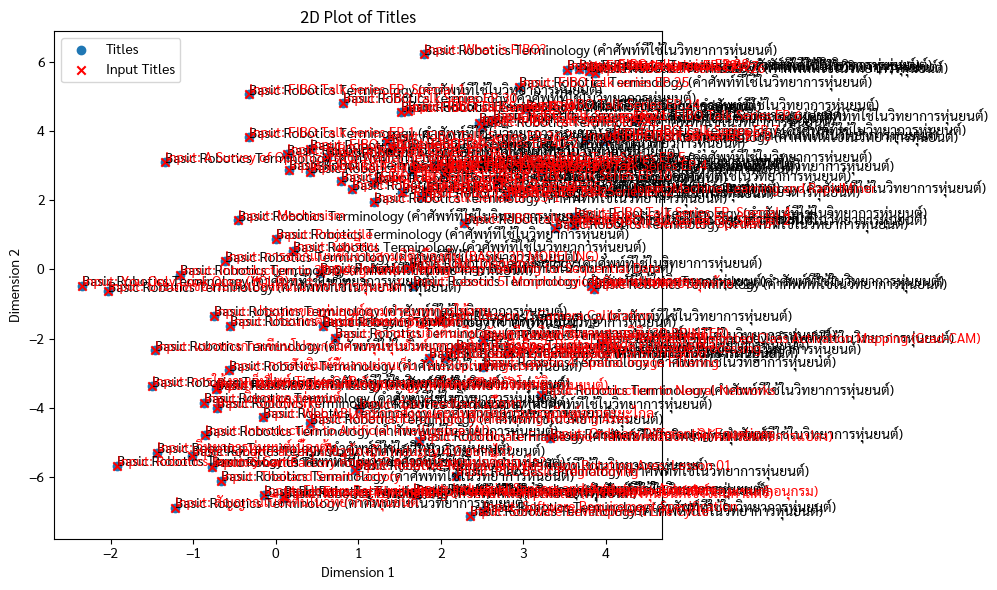

In [202]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# # Sample data (replace with your actual data)
# unique_titles_list = ["Title 1", "Title 2", "Title 3"]
# predict_embeded_titles = []  # Replace with your title embeddings

# Convert the list of embeddings to a NumPy array
predict_embeded_titles = np.array(predict_embeded_titles)

# Perform t-SNE dimensionality reduction on title embeddings to get 2D coordinates
tsne = TSNE(n_components=2, random_state=0)
embedded_titles_2d = tsne.fit_transform(predict_embeded_titles[1])

# output_df = pd.DataFrame()
# data = {'before': [], 'after': []}

# for i, unique_title in enumerate(unique_titles_list):
#     target_vector_2d = embedded_titles_2d[i]

#     # Calculate the Euclidean distance between the target vector and each vector in the list
#     distances = [np.linalg.norm(target_vector_2d - vec) for vec in embedded_titles_2d]
#     nearest_index = np.argmin(distances)

#     data['before'].append(unique_title)
#     data['after'].append(unique_titles_list[nearest_index])

output_df = pd.DataFrame(data)

# Create a scatter plot for the input titles
plt.figure(figsize=(10, 6))
plt.scatter(embedded_titles_2d[:, 0], embedded_titles_2d[:, 1], label="Titles", marker='o')

# Annotate points with titles
for i, title in enumerate(data['after']):
    plt.annotate(title, (embedded_titles_2d[i, 0], embedded_titles_2d[i, 1]))

# Create a separate scatter plot for the input titles with a different marker and color
plt.scatter(embedded_titles_2d[:, 0], embedded_titles_2d[:, 1], label="Input Titles", marker='x', color='red')

# Annotate points with input titles
for i, title in enumerate(unique_titles_list):
    plt.annotate(f"Input: {title}", (embedded_titles_2d[i, 0], embedded_titles_2d[i, 1]), color='red')

plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.title('2D Plot of Titles')
plt.tight_layout()
plt.show()


In [197]:
output_df

,before,after
0,Forward Kinematics of Serial Manipulators (การ...,Forward Kinematics of Serial Manipulators (การ...
1,FIBO Talk Series EP.9,FIBO Talk Series EP.9
2,FIBO talk series EP.28,FIBO talk series EP.28
3,FIBO Talk Series EP. Special 2,FIBO Talk Series EP. Special 2
4,วิทยาการหุ่นยนต์เบื้องต้น,วิทยาการหุ่นยนต์เบื้องต้น
...,...,...
95,FIBO Talk Series EP.41,FIBO Talk Series EP.41
96,Ordinary Differential Equations,Ordinary Differential Equations
97,FIBO Talk Series EP.32-2,FIBO Talk Series EP.32-2
98,Lesson 2: Digital Image Fundamental,Lesson 2: Digital Image Fundamental


In [ ]:
# Import necessary libraries
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Assuming you have your test data (X_test) and predictions (y_pred)
# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_train2, model.predict(X_train2))

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_train2, model.predict(X_train2))

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)


102/102 [==============================] - 0s 1ms/step
MAE: 0.022053026
MSE: 0.0008989775
RMSE: 0.029982954


In [230]:
from torch.utils.data import DataLoader, Dataset

# Create a custom dataset class (you need to implement this)
class CustomDataset(Dataset):
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

# Create an instance of your custom dataset
dataset = CustomDataset(data)

# Create a dataloader
batch_size = 64
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)


In [253]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define your custom model class
class SequenceToSequenceModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(SequenceToSequenceModel, self).__init__()

        # Define the architecture for each input sequence
        self.encoder1 = nn.LSTM(input_size, hidden_size)
        self.encoder2 = nn.LSTM(input_size, hidden_size)

        # Merge the encoded representations of both sequences
        self.concat = nn.Linear(hidden_size * 2, hidden_size)

        # Decoder for generating the output sequence
        self.decoder = nn.LSTM(hidden_size, output_size)
        self.output_layer = nn.Linear(output_size, output_size)

    def forward(self, input1, input2):

        _, (hidden1, _) = self.encoder1(input1)
        _, (hidden2, _) = self.encoder2(input2)

        # Concatenate the encoded representations
        concatenated = torch.cat((hidden1, hidden2), dim=2)
        concatenated = torch.tanh(self.concat(concatenated))

        # Decode the concatenated representation
        output, _ = self.decoder(concatenated)
        output = self.output_layer(output)

        return output

# Define hyperparameters
input_size = 6  # Feature dimension
hidden_size = 256
output_size = 6  # Output dimension
learning_rate = 0.001
epochs = 50

# Create model instance
model = SequenceToSequenceModel(input_size, hidden_size, output_size)

# Define loss and optimizer
criterion = nn.MSELoss()  # You may use an appropriate loss for your task
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
import torch
tensor1=torch.tensor([7, 8, 9])
data = [
    (torch.cat((tensor1, tensor1), dim=0), torch.cat((tensor1, tensor1), dim=0), torch.cat((tensor1, tensor1), dim=0))
    # Add more data samples as needed
]

# You can access the individual elements of each sample as follows:
sample = data[0]
input1, input2, target = sample

print(dataloader)
# Training loop
for epoch in range(epochs):
    for input1, input2, target in data:  # You need to implement your data loading logic
        print(input1)
        optimizer.zero_grad()
        # Encode both input sequences
        input1 = input1.unsqueeze(1)  # Adds a batch dimension
        input2 = input2.unsqueeze(1)  # Adds a batch dimension

        input1 = (input1 * 100000).int()
        input1=input1.sum()
        print('input1',input1)
        input2 = (input2 * 100000).int()
        print(type(input1))
        output = model(input1, input2)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{epochs}], Loss: {loss.item()}')

# After training, you can use the model for inference
# For example, model(input1, input2) to get predictions

# Don't forget to save and load your trained model for future use
# torch.save(model.state_dict(), 'model.pth')
# model.load_state_dict(torch.load('model.pth'))


tensor([7, 8, 9, 7, 8, 9])
input1 tensor(4800000)
<class 'torch.Tensor'>


IndexError: ignored

In [257]:
grouped_df

,index,user_id,title,joined_titles,embeded_title,left_title,left_title_len,title_len,right_title,left_title_embeded,right_title_embeded,left_title_joined,right_title_joined
0,0,1,[Relative-Motion Analysis using Rotating Axes:...,Relative-Motion Analysis using Rotating Axes: ...,"(tf.Tensor(-0.027242709, shape=(), dtype=float...",[Relative-Motion Analysis using Rotating Axes:...,1,3,[Industrial Sensors and Actuators - Encoders|I...,"(tf.Tensor(-0.027226185, shape=(), dtype=float...","(tf.Tensor(0.010675294, shape=(), dtype=float3...",Relative-Motion Analysis using Rotating Axes: ...,Industrial Sensors and Actuators - Encoders|In...
1,1,3,[Thailand Smart Factory|Smart Factory คืออะไร?...,Thailand Smart Factory|Smart Factory คืออะไร? ...,"(tf.Tensor(-0.019321471, shape=(), dtype=float...",[Thailand Smart Factory|Smart Factory คืออะไร?...,1,3,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,"(tf.Tensor(-0.019320304, shape=(), dtype=float...","(tf.Tensor(-0.04481983, shape=(), dtype=float3...",Thailand Smart Factory|Smart Factory คืออะไร? ...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...
2,2,5,[Software Development Life Cycle|Software Requ...,Software Development Life Cycle|Software Requi...,"(tf.Tensor(-0.07898392, shape=(), dtype=float3...",[Software Development Life Cycle|Software Requ...,3,7,[Thailand Smart Factory|Smart Factory คืออะไร?...,"(tf.Tensor(-0.038253065, shape=(), dtype=float...","(tf.Tensor(-0.05560231, shape=(), dtype=float3...",Software Development Life Cycle|Software Requi...,Thailand Smart Factory|Smart Factory คืออะไร? ...
3,3,7,[Coordinate Frame and Transformation (พิกัดเฟร...,Coordinate Frame and Transformation (พิกัดเฟรม...,"(tf.Tensor(-0.038853455, shape=(), dtype=float...",[],0,1,[Coordinate Frame and Transformation (พิกัดเฟร...,"(tf.Tensor(0.009676654, shape=(), dtype=float3...","(tf.Tensor(-0.038853444, shape=(), dtype=float...",,Coordinate Frame and Transformation (พิกัดเฟรม...
4,4,12,[Industrial Sensors and Actuators - Encoders|I...,Industrial Sensors and Actuators - Encoders|In...,"(tf.Tensor(0.02023062, shape=(), dtype=float32...",[Industrial Sensors and Actuators - Encoders|I...,4,8,"[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...","(tf.Tensor(-0.04454406, shape=(), dtype=float3...","(tf.Tensor(-0.013472811, shape=(), dtype=float...",Industrial Sensors and Actuators - Encoders|In...,Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3243,3243,3774,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019695837, shape=(), dtype=float...",[],0,1,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,"(tf.Tensor(0.009676654, shape=(), dtype=float3...","(tf.Tensor(-0.019695839, shape=(), dtype=float...",,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...
3244,3244,3775,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.019717524, shape=(), dtype=float...",[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,1,2,[Coordinate Frame and Transformation (พิกัดเฟร...,"(tf.Tensor(-0.019695839, shape=(), dtype=float...","(tf.Tensor(-0.038853455, shape=(), dtype=float...",บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,Coordinate Frame and Transformation (พิกัดเฟรม...
3245,3245,3776,"[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...",Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...,"(tf.Tensor(0.00093066966, shape=(), dtype=floa...","[Solidworks, บริบทและความสำคัญของหุ่นยนต์และระ...",2,5,[Relative-Motion Analysis using Rotating Axes:...,"(tf.Tensor(-0.0010153411, shape=(), dtype=floa...","(tf.Tensor(-0.0020225404, shape=(), dtype=floa...",Solidworks--บริบทและความสำคัญของหุ่นยนต์และระบ...,Relative-Motion Analysis using Rotating Axes: ...
3246,3246,3777,[บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|...,บริบทและความสำคัญของหุ่นยนต์และระบบอัตโนมัติ|น...,"(tf.Tensor(-0.01969583, shape=(), dtype=float3...",[],0,1,[บริบทและความสำคัญของหุ่นยน

In [262]:
def join(title):
  title='+'.join(title)
  if len(title)==0:
         title+='<s></s>'
left_titles=grouped_df['left_title'].apply(join)
right_titles=grouped_df['right_title'].apply(join)

In [268]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torch.utils.data import Dataset, DataLoader

# Define a function to tokenize a course sequence
def tokenize_course_sequence(course_sequence, course_to_index):
    print(course_sequence)
    tokens = [course_to_index[course] for course in course_sequence.split('+')]
    return tokens


# Define a custom dataset for your data
class CourseDataset(Dataset):
    def __init__(self, data, course_to_index):
        self.data = data
        self.course_to_index = course_to_index

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        input_seq, target_seq = self.data[idx]
        input_tokens = tokenize_course_sequence(input_seq, self.course_to_index)
        target_tokens = tokenize_course_sequence(target_seq, self.course_to_index)
        return torch.tensor(input_tokens), torch.tensor(target_tokens)

# Define the Transformer model (same as before)

# Hyperparameters
vocab_size = 26  # Assuming you have 26 unique courses (A-Z)
d_model = 128
nhead = 4
num_encoder_layers = 2
num_decoder_layers = 2
learning_rate = 0.001
batch_size = 32
num_epochs = 10

# Course to index mapping (assuming courses are represented by letters)
course_to_index = unique_titles_list

grouped_df

# Sample data
data = []
for i,_ in enumerate(left_titles):
  pair=(left_titles[i],right_titles[i])
  data.append(pair)

# Create DataLoader
dataset = CourseDataset(data, course_to_index)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
# Initialize the model
model = TransformerModel(vocab_size, d_model, nhead, num_encoder_layers, num_decoder_layers)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
    for src, tgt in loader:
        optimizer.zero_grad()

        # Convert src and tgt to the desired data type
        src = src[0].to(torch.int64)  # Assuming the input is a tuple with the first element being the source sequence
        tgt = tgt[0].to(torch.int64)  # Assuming the output is a tuple with the first element being the target sequence

        output = model(src, tgt)
        loss = criterion(output.view(-1, vocab_size), tgt.view(-1))
        loss.backward()
        optimizer.step()
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}")


# Inference
# Provide the model with an input sequence to generate predictions
# You will need to implement this part based on your specific requirements


None


AttributeError: ignored

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

class Seq2Seq(torch.nn.Module):
    def __init__(self):
        super(Seq2Seq, self).__init__()
        self.encoder = torch.nn.LSTM(512, 512, 1)
        self.decoder = torch.nn.LSTM(512, 512, 1)
        self.linear = torch.nn.Linear(512, 512)

    def forward(self, input, hidden):
        x, encoder_hidden = self.encoder(input, hidden)
        x, decoder_hidden = self.decoder(x, hidden)
        x = self.linear(x)
        return x, decoder_hidden


model = Seq2Seq()

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters())
train_loader=zip(left_title_embeded_list,right_title_embeded_list)
# Train the model
for epoch in range(100):
    for i, (left_title_embeded_list, right_title_embeded_list) in enumerate(train_loader):
        # Forward pass
        output, hidden = model(left_title_embeded_list)

        # Calculate the loss
        loss = criterion(output, right_title_embeded_list)

        # Backpropagate the loss
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Print the loss every 100 steps
        if i % 100 == 0:
            print(f"Epoch: {epoch}, Loss: {loss.item()}")

TypeError: ignored

In [ ]:
# First we apply an transformation to input using an initial transformation.
# data = [[1., 2., 3.], [4., 5., 6.], [7.,8.,9.]]
input = torch_tensor # input matrix
input=torch.reshape(input, (3, 512))
transform = nn.Linear(512,3248) # create transform
output = transform(input) # apply the transform
print(f"input = {input}")
print(f"output size = {output.size}")
print(f"output = {output}")
print(f"transform.weight = {transform.weight}")
print(f"transform.bias = {transform.bias}")
print(f"computation check = {torch.matmul(input, torch.t(transform.weight)) + transform.bias}")
# Now we set a new weight and bias.   Note that these are set as Parameters, a special tensor.
# See https://pytorch.org/docs/stable/generated/torch.nn.parameter.Parameter.html.
transform.weight = nn.Parameter(output)
transform.bias = nn.Parameter(torch.tensor([[0.5, 0.5, 0.5]]))
new_output = transform(output)
print(f"transform.weight = {transform.weight}")
print(f"transform.bias = {transform.bias}")
# Note that the following matrices are all the same.
print(f"new_output = {new_output}")
print(f"computation check = {torch.matmul(output, torch.t(transform.weight)) + transform.bias}")
# Finally we illustrate the forward method of Linear.
print(f"transform.forward(output) = {transform.forward(output)}")



RuntimeError: ignored

Need to investigate the role the copy.deepcopy() method.

In [ ]:
def clones(module, N):
    "Produce N identical layers."
    return nn.ModuleList([copy.deepcopy(module) for _ in range(N)])

In [ ]:
class Encoder(nn.Module):
    "Core encoder is a stack of N layers"

    def __init__(self, layer, N):
        super(Encoder, self).__init__()
        self.layers = clones(layer, N)
        self.norm = LayerNorm(layer.size)

    def forward(self, x, mask):
        "Pass the input (and mask) through each layer in turn."
        for layer in self.layers:
            x = layer(x, mask)
        return self.norm(x)

# Start with Layer Normalization

"We employ a residual connection around each of the two sub-layers, followed by layer normalization."

For paper on residual connections see:
[Deep Residual Learning for Image Recognition](https://arxiv.org/abs/1512.03385)

For paper on layer normalization see: [Layer Normalization](https://arxiv.org/abs/1607.06450)

For paper on batch normalization see: [Batch Normalizaton](https://arxiv.org/abs/1502.03167)


In [ ]:
class LayerNorm(nn.Module):
    "Construct a layernorm module (See citation for details)."

    def __init__(self, features, eps=1e-6):
        super(LayerNorm, self).__init__()
        self.a_2 = nn.Parameter(torch.ones(features))
        self.b_2 = nn.Parameter(torch.zeros(features))
        self.eps = eps

    def forward(self, x):
        mean = x.mean(-1, keepdim=True)
        std = x.std(-1, keepdim=True)
        return self.a_2 * (x - mean) / (std + self.eps) + self.b_2


"Each layer has two sub-layers. The first is a multi-head self-attention mechanism, and the second is a simple, position-wise fully connected feed-forward network."

In [ ]:
class SublayerConnection(nn.Module):
    """
    A residual connection followed by a layer norm.
    Note for code simplicity the norm is first as opposed to last.
    """

    def __init__(self, size, dropout):
        super(SublayerConnection, self).__init__()
        self.norm = LayerNorm(size)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, sublayer):
        "Apply residual connection to any sublayer with the same size."
        return x + self.dropout(sublayer(self.norm(x)))

Each layer has two sub-layers. The first is a multi-head self-attention mechanism, and the second is a simple, position-wise fully connected feed-forward network.

In [ ]:
class EncoderLayer(nn.Module):
    "Encoder is made up of self-attn and feed forward (defined below)"

    def __init__(self, size, self_attn, feed_forward, dropout):
        super(EncoderLayer, self).__init__()
        self.self_attn = self_attn
        self.feed_forward = feed_forward
        self.sublayer = clones(SublayerConnection(size, dropout), 2)
        self.size = size

    def forward(self, x, mask):
        "Follow Figure 1 (left) for connections."
        x = self.sublayer[0](x, lambda x: self.self_attn(x, x, x, mask))
        return self.sublayer[1](x, self.feed_forward)

The decoder is also composed of a stack of $N=6$ identical layers.

In [ ]:
class Decoder(nn.Module):
    "Generic N layer decoder with masking."

    def __init__(self, layer, N):
        super(Decoder, self).__init__()
        self.layers = clones(layer, N)
        self.norm = LayerNorm(layer.size)

    def forward(self, x, memory, src_mask, tgt_mask):
        for layer in self.layers:
            x = layer(x, memory, src_mask, tgt_mask)
        return self.norm(x)

In addition to the two sub-layers in each encoder layer, the decoder inserts a third sub-layer, which performs multi-head attention over the output of the encoder stack. Similar to the encoder, we employ residual connections around each of the sub-layers, followed by layer normalization.

In [ ]:
class DecoderLayer(nn.Module):
    "Decoder is made of self-attn, src-attn, and feed forward (defined below)"

    def __init__(self, size, self_attn, src_attn, feed_forward, dropout):
        super(DecoderLayer, self).__init__()
        self.size = size
        self.self_attn = self_attn
        self.src_attn = src_attn
        self.feed_forward = feed_forward
        self.sublayer = clones(SublayerConnection(size, dropout), 3)

    def forward(self, x, memory, src_mask, tgt_mask):
        "Follow Figure 1 (right) for connections."
        m = memory
        x = self.sublayer[0](x, lambda x: self.self_attn(x, x, x, tgt_mask))
        x = self.sublayer[1](x, lambda x: self.src_attn(x, m, m, src_mask))
        return self.sublayer[2](x, self.feed_forward)

We also modify the self-attention sub-layer in the decoder stack to prevent positions from attending to subsequent positions. This masking, combined with fact that the output embeddings are offset by one position, ensures that the predictions for position $i$ can depend only on the known outputs at positions less than $i$.

In [ ]:
def subsequent_mask(size):
    "Mask out subsequent positions."
    attn_shape = (1, size, size)
    subsequent_mask = torch.triu(torch.ones(attn_shape), diagonal=1).type(
        torch.uint8
    )
    return subsequent_mask == 0

Below the attention mask shows the position each tgt word (row) is allowed to look at (column). Words are blocked for attending to future words during training.

In [ ]:
max_pos = 10
def example_mask():
    LS_data = pd.concat(
        [
            pd.DataFrame(
                {
                    "Subsequent Mask": subsequent_mask(max_pos)[0][x, y].flatten(),
                    "Window": y,
                    "Masking": x,
                }
            )
            for y in range(max_pos)
            for x in range(max_pos)
        ]
    )

    return (
        alt.Chart(LS_data)
        .mark_rect()
        .properties(height=250, width=250)
        .encode(
            alt.X("Window:O"),
            alt.Y("Masking:O"),
            alt.Color("Subsequent Mask:Q", scale=alt.Scale(scheme="viridis")),
        )
        .interactive()
    )


show_example(example_mask)

alt.Chart(...)

# Attention

We call our particular attention “Scaled Dot-Product Attention”. The input consists of queries and keys of dimension $d_k$, and values of dimension $d_v$. We compute the dot products of the query with all keys, divide each by $\sqrt{d_k}$ , and apply a softmax function to obtain the weights on the values.


In [ ]:
def attention(query, key, value, mask=None, dropout=None):
    "Compute 'Scaled Dot Product Attention'"
    d_k = query.size(-1)
    # Here is the attention function
    scores = torch.matmul(query, key.transpose(-2, -1)) / math.sqrt(d_k)
    if mask is not None:
        scores = scores.masked_fill(mask == 0, -1e9)
    p_attn = scores.softmax(dim=-1)
    if dropout is not None:
        p_attn = dropout(p_attn)
    return torch.matmul(p_attn, value), p_attn

# Multi-head Attention

"Multi-head attention allows the model to jointly attend to information from different representation subspaces at different positions."

"In this work we employ $h=8$ parallel attention layers, or heads. For each of these we use $d_k=d_v=d_{\text{model}}/h=64$ due to the reduced dimension of each head, the total computational cost is similar to that of single-head attention with full dimensionality."


***Note that for Latex in markdown we simply need to surround the equation with \\$ as follows \\$equation\\$. Also to escape \\$ we use \\\\.***




In [ ]:
class MultiHeadedAttention(nn.Module):
    def __init__(self, h, d_model, dropout=0.1):
        "Take in model size and number of heads."
        super(MultiHeadedAttention, self).__init__()
        assert d_model % h == 0
        # We assume d_v always equals d_k
        self.d_k = d_model // h
        self.h = h
        self.linears = clones(nn.Linear(d_model, d_model), 4)
        self.attn = None
        self.dropout = nn.Dropout(p=dropout)

    def forward(self, query, key, value, mask=None):
        "Implements Figure 2"
        if mask is not None:
            # Same mask applied to all h heads.
            mask = mask.unsqueeze(1)
        nbatches = query.size(0)

        # 1) Do all the linear projections in batch from d_model => h x d_k
        query, key, value = [
            lin(x).view(nbatches, -1, self.h, self.d_k).transpose(1, 2)
            for lin, x in zip(self.linears, (query, key, value))
        ]

        # 2) Apply attention on all the projected vectors in batch.
        x, self.attn = attention(
            query, key, value, mask=mask, dropout=self.dropout
        )

        # 3) "Concat" using a view and apply a final linear.
        x = (
            x.transpose(1, 2)
            .contiguous()
            .view(nbatches, -1, self.h * self.d_k)
        )
        del query
        del key
        del value
        return self.linears[-1](x)

In [ ]:
class PositionwiseFeedForward(nn.Module):
    "Implements FFN equation."

    def __init__(self, d_model, d_ff, dropout=0.1):
        super(PositionwiseFeedForward, self).__init__()
        self.w_1 = nn.Linear(d_model, d_ff)
        self.w_2 = nn.Linear(d_ff, d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        return self.w_2(self.dropout(self.w_1(x).relu()))

In [ ]:
class Embeddings(nn.Module):
    def __init__(self, d_model, vocab):
        super(Embeddings, self).__init__()
        self.lut = nn.Embedding(vocab, d_model)
        self.d_model = d_model

    def forward(self, x):
        return self.lut(x) * math.sqrt(self.d_model)

Since the transformer has no recurrence and no convolution some information about position needs to be introduced.   The transformer uses positional embeddings for this purpose.

In the paper the authors state that:

"We chose this function because we hypothesized it would allow the model to easily learn to attend by relative positions, since for any fixed offset $k$, $PE_{pos+k}$ can be represented as a linear function of $PE_{pos}$."

This linear function follows from a standard trigonometric identity.   See [Fourier Series]( https://en.wikipedia.org/wiki/Fourier_series) (Eq. 3).

In [ ]:
class PositionalEncoding(nn.Module):
    "Implement the PE function."

    def __init__(self, d_model, dropout, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        # Compute the positional encodings once in log space.
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len).unsqueeze(1)
        div_term = torch.exp(
            torch.arange(0, d_model, 2) * -(math.log(10000.0) / d_model)
        )
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer("pe", pe)

    def forward(self, x):
        x = x + self.pe[:, : x.size(1)].requires_grad_(False)
        return self.dropout(x)

In [ ]:
def example_positional():
    pe = PositionalEncoding(20, 0)
    y = pe.forward(torch.zeros(1, 100, 20))

    data = pd.concat(
        [
            pd.DataFrame(
                {
                    "embedding": y[0, :, dim],
                    "dimension": dim,
                    "position": list(range(100)),
                }
            )
            for dim in [4, 5, 6, 7]
        ]
    )

    return (
        alt.Chart(data)
        .mark_line()
        .properties(width=800)
        .encode(x="position", y="embedding", color="dimension:N")
        .interactive()
    )


show_example(example_positional)

alt.Chart(...)

In [ ]:
def make_model(
    src_vocab, tgt_vocab, N=6, d_model=512, d_ff=2048, h=8, dropout=0.1
):
    "Helper: Construct a model from hyperparameters."
    c = copy.deepcopy
    attn = MultiHeadedAttention(h, d_model)
    ff = PositionwiseFeedForward(d_model, d_ff, dropout)
    position = PositionalEncoding(d_model, dropout)
    model = EncoderDecoder(
        Encoder(EncoderLayer(d_model, c(attn), c(ff), dropout), N),
        Decoder(DecoderLayer(d_model, c(attn), c(attn), c(ff), dropout), N),
        nn.Sequential(Embeddings(d_model, src_vocab), c(position)),
        nn.Sequential(Embeddings(d_model, tgt_vocab), c(position)),
        Generator(d_model, tgt_vocab),
    )

    # This was important from their code.
    # Initialize parameters with Glorot / fan_avg.
    for p in model.parameters():
        if p.dim() > 1:
            nn.init.xavier_uniform_(p)
    return model

In [ ]:
def inference_test():
    test_model = make_model(11, 11, 2)
    test_model.eval()
    src = torch.LongTensor([[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]])
    src_mask = torch.ones(1, 1, 10)

    memory = test_model.encode(src, src_mask)
    ys = torch.zeros(1, 1).type_as(src)

    for i in range(9):
        out = test_model.decode(
            memory, src_mask, ys, subsequent_mask(ys.size(1)).type_as(src.data)
        )
        prob = test_model.generator(out[:, -1])
        _, next_word = torch.max(prob, dim=1)
        next_word = next_word.data[0]
        ys = torch.cat(
            [ys, torch.empty(1, 1).type_as(src.data).fill_(next_word)], dim=1
        )

    print("Example Untrained Model Prediction:", ys)


def run_tests():
    for _ in range(10):
        inference_test()


show_example(run_tests)

Example Untrained Model Prediction: tensor([[0, 9, 7, 3, 4, 4, 4, 4, 4, 4]])
Example Untrained Model Prediction: tensor([[0, 1, 3, 5, 5, 1, 1, 1, 1, 9]])
Example Untrained Model Prediction: tensor([[0, 8, 2, 7, 3, 3, 3, 3, 3, 3]])
Example Untrained Model Prediction: tensor([[ 0, 10, 10, 10, 10, 10, 10, 10, 10, 10]])
Example Untrained Model Prediction: tensor([[ 0,  6,  4, 10,  4,  5,  4, 10,  4, 10]])
Example Untrained Model Prediction: tensor([[0, 4, 4, 4, 4, 4, 4, 4, 4, 4]])
Example Untrained Model Prediction: tensor([[0, 0, 2, 2, 2, 2, 2, 2, 2, 2]])
Example Untrained Model Prediction: tensor([[0, 3, 2, 9, 3, 6, 5, 9, 3, 6]])
Example Untrained Model Prediction: tensor([[ 0,  5, 10,  4, 10,  4, 10,  4, 10,  4]])
Example Untrained Model Prediction: tensor([[0, 2, 3, 2, 3, 3, 3, 4, 2, 2]])


In [ ]:
class Batch:
    """Object for holding a batch of data with mask during training."""

    def __init__(self, src, tgt=None, pad=2):  # 2 = <blank>
        self.src = src
        self.src_mask = (src != pad).unsqueeze(-2)
        if tgt is not None:
            self.tgt = tgt[:, :-1]
            self.tgt_y = tgt[:, 1:]
            self.tgt_mask = self.make_std_mask(self.tgt, pad)
            self.ntokens = (self.tgt_y != pad).data.sum()

    @staticmethod
    def make_std_mask(tgt, pad):
        "Create a mask to hide padding and future words."
        tgt_mask = (tgt != pad).unsqueeze(-2)
        tgt_mask = tgt_mask & subsequent_mask(tgt.size(-1)).type_as(
            tgt_mask.data
        )
        return tgt_mask

In [ ]:
# Note how a class is used to hold the values of important parameters.
class TrainState:
    """Track number of steps, examples, and tokens processed"""

    step: int = 0  # Steps in the current epoch
    accum_step: int = 0  # Number of gradient accumulation steps
    samples: int = 0  # total # of examples used
    tokens: int = 0  # total # of tokens processed

In [ ]:
def run_epoch(
    data_iter,
    model,
    loss_compute,
    optimizer,
    scheduler,
    mode="train",
    accum_iter=1,
    train_state=TrainState(),
):
    """Train a single epoch"""
    start = time.time()
    total_tokens = 0
    total_loss = 0
    tokens = 0
    n_accum = 0
    for i, batch in enumerate(data_iter):
        out = model.forward(
            batch.src, batch.tgt, batch.src_mask, batch.tgt_mask
        )
        loss, loss_node = loss_compute(out, batch.tgt_y, batch.ntokens)
        # loss_node = loss_node / accum_iter
        if mode == "train" or mode == "train+log":
            loss_node.backward()
            train_state.step += 1
            train_state.samples += batch.src.shape[0]
            train_state.tokens += batch.ntokens
            if i % accum_iter == 0:
                optimizer.step()
                optimizer.zero_grad(set_to_none=True)
                n_accum += 1
                train_state.accum_step += 1
            scheduler.step()

        total_loss += loss
        total_tokens += batch.ntokens
        tokens += batch.ntokens
        if i % 40 == 1 and (mode == "train" or mode == "train+log"):
            lr = optimizer.param_groups[0]["lr"]
            elapsed = time.time() - start
            print(
                (
                    "Epoch Step: %6d | Accumulation Step: %3d | Loss: %6.2f "
                    + "| Tokens / Sec: %7.1f | Learning Rate: %6.1e"
                )
                % (i, n_accum, loss / batch.ntokens, tokens / elapsed, lr)
            )
            start = time.time()
            tokens = 0
        del loss
        del loss_node
    return total_loss / total_tokens, train_state

In [ ]:
def rate(step, model_size, factor, warmup):
    """
    we have to default the step to 1 for LambdaLR function
    to avoid zero raising to negative power.
    """
    if step == 0:
        step = 1
    return factor * (
        model_size ** (-0.5) * min(step ** (-0.5), step * warmup ** (-1.5))
    )

In [ ]:
def example_learning_schedule():
    opts = [
        [512, 1, 4000],  # example 1
        [512, 1, 8000],  # example 2
        [256, 1, 4000],  # example 3
    ]

    dummy_model = torch.nn.Linear(1, 1)
    learning_rates = []

    # we have 3 examples in opts list.
    for idx, example in enumerate(opts):
        # run 20000 epoch for each example
        optimizer = torch.optim.Adam(
            dummy_model.parameters(), lr=1, betas=(0.9, 0.98), eps=1e-9
        )
        lr_scheduler = LambdaLR(
            optimizer=optimizer, lr_lambda=lambda step: rate(step, *example)
        )
        tmp = []
        # take 20K dummy training steps, save the learning rate at each step
        for step in range(20000):
            tmp.append(optimizer.param_groups[0]["lr"])
            optimizer.step()
            lr_scheduler.step()
        learning_rates.append(tmp)

    learning_rates = torch.tensor(learning_rates)

    # Enable altair to handle more than 5000 rows
    alt.data_transformers.disable_max_rows()

    opts_data = pd.concat(
        [
            pd.DataFrame(
                {
                    "Learning Rate": learning_rates[warmup_idx, :],
                    "model_size:warmup": ["512:4000", "512:8000", "256:4000"][
                        warmup_idx
                    ],
                    "step": range(20000),
                }
            )
            for warmup_idx in [0, 1, 2]
        ]
    )

    return (
        alt.Chart(opts_data)
        .mark_line()
        .properties(width=600)
        .encode(x="step", y="Learning Rate", color="model_size:warmup:N")
        .interactive()
    )


example_learning_schedule()

alt.Chart(...)

# Regularization

The original paper on label smoothing is cited Annotated Transformer listed in the README file for these notes.

In [ ]:
class LabelSmoothing(nn.Module):
    "Implement label smoothing."

    def __init__(self, size, padding_idx, smoothing=0.0):
        super(LabelSmoothing, self).__init__()
        self.criterion = nn.KLDivLoss(reduction="sum")
        self.padding_idx = padding_idx
        self.confidence = 1.0 - smoothing
        self.smoothing = smoothing
        self.size = size
        self.true_dist = None

    def forward(self, x, target):
        assert x.size(1) == self.size
        true_dist = x.data.clone()
        true_dist.fill_(self.smoothing / (self.size - 2))
        true_dist.scatter_(1, target.data.unsqueeze(1), self.confidence)
        true_dist[:, self.padding_idx] = 0
        mask = torch.nonzero(target.data == self.padding_idx)
        if mask.dim() > 0:
            true_dist.index_fill_(0, mask.squeeze(), 0.0)
        self.true_dist = true_dist
        return self.criterion(x, true_dist.clone().detach())

In [ ]:
# Example of label smoothing.

def example_label_smoothing():
    crit = LabelSmoothing(5, 0, 0.4)
    predict = torch.FloatTensor(
        [
            [0, 0.2, 0.7, 0.1, 0],
            [0, 0.2, 0.7, 0.1, 0],
            [0, 0.2, 0.7, 0.1, 0],
            [0, 0.2, 0.7, 0.1, 0],
            [0, 0.2, 0.7, 0.1, 0],
        ]
    )
    crit(x=predict.log(), target=torch.LongTensor([2, 1, 0, 3, 3]))
    LS_data = pd.concat(
        [
            pd.DataFrame(
                {
                    "target distribution": crit.true_dist[x, y].flatten(),
                    "columns": y,
                    "rows": x,
                }
            )
            for y in range(5)
            for x in range(5)
        ]
    )

    return (
        alt.Chart(LS_data)
        .mark_rect(color="Blue", opacity=1)
        .properties(height=200, width=200)
        .encode(
            alt.X("columns:O", title=None),
            alt.Y("rows:O", title=None),
            alt.Color(
                "target distribution:Q", scale=alt.Scale(scheme="viridis")
            ),
        )
        .interactive()
    )

show_example(example_label_smoothing)


alt.Chart(...)

In [ ]:


def loss(x, crit):
    d = x + 3 * 1
    predict = torch.FloatTensor([[0, x / d, 1 / d, 1 / d, 1 / d]])
    return crit(predict.log(), torch.LongTensor([1])).data


def penalization_visualization():
    crit = LabelSmoothing(5, 0, 0.1)
    loss_data = pd.DataFrame(
        {
            "Loss": [loss(x, crit) for x in range(1, 100)],
            "Steps": list(range(99)),
        }
    ).astype("float")

    return (
        alt.Chart(loss_data)
        .mark_line()
        .properties(width=350)
        .encode(
            x="Steps",
            y="Loss",
        )
        .interactive()
    )


show_example(penalization_visualization)

alt.Chart(...)

First example:  The copy-task or identity function.

In [ ]:
def data_gen(V, batch_size, nbatches):
    "Generate random data for a src-tgt copy task."
    for i in range(nbatches):
        data = torch.randint(1, V, size=(batch_size, 10))
        data[:, 0] = 1
        src = data.requires_grad_(False).clone().detach()
        tgt = data.requires_grad_(False).clone().detach()
        yield Batch(src, tgt, 0)

In [ ]:
class SimpleLossCompute:
    "A simple loss compute and train function."

    def __init__(self, generator, criterion):
        self.generator = generator
        self.criterion = criterion

    def __call__(self, x, y, norm):
        x = self.generator(x)
        sloss = (
            self.criterion(
                x.contiguous().view(-1, x.size(-1)), y.contiguous().view(-1)
            )
            / norm
        )
        return sloss.data * norm, sloss

Greedy decoding is used the predict the translation.   Basically the model choses the translation with the highest probability.

In [ ]:
def greedy_decode(model, src, src_mask, max_len, start_symbol):
    memory = model.encode(src, src_mask)
    ys = torch.zeros(1, 1).fill_(start_symbol).type_as(src.data)
    for i in range(max_len - 1):
        out = model.decode(
            memory, src_mask, ys, subsequent_mask(ys.size(1)).type_as(src.data)
        )
        prob = model.generator(out[:, -1])
        _, next_word = torch.max(prob, dim=1)
        next_word = next_word.data[0]
        ys = torch.cat(
            [ys, torch.zeros(1, 1).type_as(src.data).fill_(next_word)], dim=1
        )
    return ys

In [ ]:
# Train the simple copy task.  The model generates the input tensor (src).


def example_simple_model():
    V = 11
    criterion = LabelSmoothing(size=V, padding_idx=0, smoothing=0.0)
    model = make_model(V, V, N=2)

    optimizer = torch.optim.Adam(
        model.parameters(), lr=0.5, betas=(0.9, 0.98), eps=1e-9
    )
    lr_scheduler = LambdaLR(
        optimizer=optimizer,
        lr_lambda=lambda step: rate(
            step, model_size=model.src_embed[0].d_model, factor=1.0, warmup=400
        ),
    )

    batch_size = 80
    for epoch in range(20):
        model.train()
        run_epoch(
            data_gen(V, batch_size, 20),
            model,
            SimpleLossCompute(model.generator, criterion),
            optimizer,
            lr_scheduler,
            mode="train",
        )
        model.eval()
        run_epoch(
            data_gen(V, batch_size, 5),
            model,
            SimpleLossCompute(model.generator, criterion),
            DummyOptimizer(),
            DummyScheduler(),
            mode="eval",
        )[0]

    model.eval()
    src = torch.LongTensor([[0, 1, 2, 3, 4, 1, 2, 3, 4, 5]])
    max_len = src.shape[1]
    src_mask = torch.ones(1, 1, max_len)
    print(greedy_decode(model, src, src_mask, max_len=max_len, start_symbol=0))


execute_example(example_simple_model)

NameError: ignored

# Part 3:  A Real World Example

Since the Multi30K dataset is offline, I am going to implement the dataset by hand.   I will use this the German/English dataset from the European Parliament Proceedings Parallel Corpus 1996-2011 found here
https://www.statmt.org/europarl/.   I am go to trying using 100000, 4000, 4000 sentences for the training, testing, and validation sets.  The datasets should be list of tuples of parallel German/English sentences.  For example:

test = [(german_sent_1, english_sent_1), ...
(german_sent_N, englishsent_N)]

sample_list = [('Wiederaufnahme der Sitzungsperiode\n', 'Resumption of the session\n'), ('Ich erkläre die am Freitag, dem 17. Dezember unterbrochene Sitzungsperiode des Europäischen Parlaments für wiederaufgenommen, wünsche Ihnen nochmals alles Gute zum Jahreswechsel und hoffe, daß Sie schöne Ferien hatten.\n', 'I declare resumed the session of the European Parliament adjourned on Friday 17 December 1999, and I would like once again to wish you a happy new year in the hope that you enjoyed a pleasant festive period.\n'), ('Wie Sie feststellen konnten, ist der gefürchtete "Millenium-Bug " nicht eingetreten. Doch sind Bürger einiger unserer Mitgliedstaaten Opfer von schrecklichen Naturkatastrophen geworden.\n', "Although, as you will have seen, the dreaded 'millennium bug' failed to materialise, still the people in a number of countries suffered a series of natural disasters that truly were dreadful.\n")]

In [ ]:
""" Move to the directory containing the language datesets."""
import os
os.chdir("drive/MyDrive/Colab Notebooks/datasets")
os.getcwd()
os.listdir()
print(os.getcwd())

/content/drive/MyDrive/Colab Notebooks/datasets


In [ ]:
"""Some code to open two large file containing parallel German/English sentences
and construct the dataset needed for training the transformer."""

""" The language files are stored in my Google Drive.   The drive needs to be mounted at the
beginning of the session from the CoLab file menu.   The code in the previous cell
will set the cwd to the appropriate folder"""

"""
******************************************
To switch to Spanish I need the files for Spanish/English text pairs referenced here
and the files stored in the cwd.
******************************************

"""

my_file_en = "europarl-v7.de-en.en"
my_file_de = "europarl-v7.de-en.de"

# my_file_en = ""
# my_file_es = ""

# May need to adjust these parameters for new translation tasks.
size_train = 100000
size_val = 4000
size_test = 4000

train = []
val = []
test = []

de_list = []
en_list = []

count = 0;
with open(my_file_de, encoding="utf8") as fp:
  for line in fp:
    de_list.append(line)
    if count >= (size_train + size_val + size_test - 1):
      break
    count += 1

count = 0;
with open(my_file_en, encoding="utf8") as fp:
  for line in fp:
    en_list.append(line)
    if count > (size_train + size_val + size_test - 1):
      break
    count += 1

dataset = list(zip(de_list, en_list))
train = dataset[:size_train]
val = dataset[size_train:size_train+size_val]
test = dataset[size_train+size_val:size_train+size_val+size_test]

print(len(train), len(val), len(test))





100000 4000 4000


In [ ]:
# Load spacy tokenizer models, download them if they haven't been
# downloaded already


def load_tokenizers():

    try:
        spacy_de = spacy.load("de_core_news_sm")
    except IOError:
        os.system("python -m spacy download de_core_news_sm")
        spacy_de = spacy.load("de_core_news_sm")

    try:
        spacy_en = spacy.load("en_core_web_sm")
    except IOError:
        os.system("python -m spacy download en_core_web_sm")
        spacy_en = spacy.load("en_core_web_sm")

    return spacy_de, spacy_en

In [ ]:
def tokenize(text, tokenizer):
    return [tok.text for tok in tokenizer.tokenizer(text)]


def yield_tokens(data_iter, tokenizer, index):
    for from_to_tuple in data_iter:
        yield tokenizer(from_to_tuple[index])

In [ ]:

def build_vocabulary(spacy_de, spacy_en, train, val, test):
    def tokenize_de(text):
        return tokenize(text, spacy_de)

    def tokenize_en(text):
        return tokenize(text, spacy_en)

    print("Building German Vocabulary ...")
    # train, val, test = datasets.Multi30k(language_pair=("de", "en"))
    # train, val, test = datasets.IWSLT2017(language_pair=("de", "en"))
    vocab_src = build_vocab_from_iterator(
        yield_tokens(train + val + test, tokenize_de, index=0),
        min_freq=2,
        specials=["<s>", "</s>", "<blank>", "<unk>"],
    )

    print("Building English Vocabulary ...")
    # train, val, test = datasets.Multi30k(language_pair=("de", "en"))
    # train, val, test = datasets.IWSLT2017(language_pair=("de", "en"))
    vocab_tgt = build_vocab_from_iterator(
        yield_tokens(train + val + test, tokenize_en, index=1),
        min_freq=2,
        specials=["<s>", "</s>", "<blank>", "<unk>"],
    )

    vocab_src.set_default_index(vocab_src["<unk>"])
    vocab_tgt.set_default_index(vocab_tgt["<unk>"])

    return vocab_src, vocab_tgt


def load_vocab(spacy_de, spacy_en):
    if not exists("vocab.pt"):
        vocab_src, vocab_tgt = build_vocabulary(spacy_de, spacy_en, train, val, test)
        torch.save((vocab_src, vocab_tgt), "vocab.pt")
    else:
        vocab_src, vocab_tgt = torch.load("vocab.pt")
    print("Finished.\nVocabulary sizes:")
    print(len(vocab_src))
    print(len(vocab_tgt))
    return vocab_src, vocab_tgt


if is_interactive_notebook():
    # global variables used later in the script
    spacy_de, spacy_en = show_example(load_tokenizers)
    vocab_src, vocab_tgt = show_example(load_vocab, args=[spacy_de, spacy_en])

Building German Vocabulary ...
Building English Vocabulary ...
Finished.
Vocabulary sizes:
41372
21549


Perhaps this site could be helpful:

See https://github.com/PetrochukM/PyTorch-NLP/blob/master/torchnlp/datasets/multi30k.py

# !pip install pytorch-nlp

These folks have written about the same problem:

https://discuss.pytorch.org/t/build-vocab-from-iterator-does-not-work-in-notebook/153575/4

Other possible source of answers:
https://github.com/pytorch/data

In [ ]:
def collate_batch(
    batch,
    src_pipeline,
    tgt_pipeline,
    src_vocab,
    tgt_vocab,
    device,
    max_padding=128,
    pad_id=2,
):
    bs_id = torch.tensor([0], device=device)  # <s> token id
    eos_id = torch.tensor([1], device=device)  # </s> token id
    src_list, tgt_list = [], []
    for (_src, _tgt) in batch:
        processed_src = torch.cat(
            [
                bs_id,
                torch.tensor(
                    src_vocab(src_pipeline(_src)),
                    dtype=torch.int64,
                    device=device,
                ),
                eos_id,
            ],
            0,
        )
        processed_tgt = torch.cat(
            [
                bs_id,
                torch.tensor(
                    tgt_vocab(tgt_pipeline(_tgt)),
                    dtype=torch.int64,
                    device=device,
                ),
                eos_id,
            ],
            0,
        )
        src_list.append(
            # warning - overwrites values for negative values of padding - len
            pad(
                processed_src,
                (
                    0,
                    max_padding - len(processed_src),
                ),
                value=pad_id,
            )
        )
        tgt_list.append(
            pad(
                processed_tgt,
                (0, max_padding - len(processed_tgt)),
                value=pad_id,
            )
        )

    src = torch.stack(src_list)
    tgt = torch.stack(tgt_list)
    return (src, tgt)

Need to (1) add parameters to create_dataloaders for train, val, and test and remove (2)  Remove call to datasets.Multi30K in the code below.

In [ ]:
def create_dataloaders(
    device,
    vocab_src,
    vocab_tgt,
    spacy_de,
    spacy_en,
    batch_size=12000,
    max_padding=128,
    is_distributed=True,
):
    # def create_dataloaders(batch_size=12000):
    def tokenize_de(text):
        return tokenize(text, spacy_de)

    def tokenize_en(text):
        return tokenize(text, spacy_en)

    def collate_fn(batch):
        return collate_batch(
            batch,
            tokenize_de,
            tokenize_en,
            vocab_src,
            vocab_tgt,
            device,
            max_padding=max_padding,
            pad_id=vocab_src.get_stoi()["<blank>"],
        )
    ##########################################################
    #  Here is the call to datasets that is causing the fail.
    ##########################################################

    # Old code
    # train_iter, valid_iter, test_iter = datasets.Multi30k(
    #    language_pair=("de", "en")
    #)

    # Simple solution
    train_iter, valid_iter, test_iter = train, val, test

    train_iter_map = to_map_style_dataset(
        train_iter
    )  # DistributedSampler needs a dataset len()
    train_sampler = (
        DistributedSampler(train_iter_map) if is_distributed else None
    )
    valid_iter_map = to_map_style_dataset(valid_iter)
    valid_sampler = (
        DistributedSampler(valid_iter_map) if is_distributed else None
    )

    train_dataloader = DataLoader(
        train_iter_map,
        batch_size=batch_size,
        shuffle=(train_sampler is None),
        sampler=train_sampler,
        collate_fn=collate_fn,
    )
    valid_dataloader = DataLoader(
        valid_iter_map,
        batch_size=batch_size,
        shuffle=(valid_sampler is None),
        sampler=valid_sampler,
        collate_fn=collate_fn,
    )
    return train_dataloader, valid_dataloader

In [ ]:
def train_worker(
    gpu,
    ngpus_per_node,
    vocab_src,
    vocab_tgt,
    spacy_de,
    spacy_en,
    config,
    is_distributed=False,
):
    print(f"Train worker process using GPU: {gpu} for training", flush=True)
    torch.cuda.set_device(gpu)

    pad_idx = vocab_tgt["<blank>"]
    d_model = 512
    print("Got to this point(1)!!!")
    model = make_model(len(vocab_src), len(vocab_tgt), N=6)
    print("Got to this point(2)!!!")
    model.cuda(gpu)
    print("Got to this point(3)!!!")
    module = model
    print("Got to this point(4)!!!")
    is_main_process = True
    if is_distributed:
        dist.init_process_group(
            "nccl", init_method="env://", rank=gpu, world_size=ngpus_per_node
        )
        model = DDP(model, device_ids=[gpu])
        module = model.module
        is_main_process = gpu == 0

    criterion = LabelSmoothing(
        size=len(vocab_tgt), padding_idx=pad_idx, smoothing=0.1
    )
    criterion.cuda(gpu)
    print("Got to this point(5)!!!")
    #############################
    ## PROBLEM IS HERE BELOW!  ##
    #############################
    train_dataloader, valid_dataloader = create_dataloaders(
        gpu,
        vocab_src,
        vocab_tgt,
        spacy_de,
        spacy_en,
        batch_size=config["batch_size"] // ngpus_per_node,
        max_padding=config["max_padding"],
        is_distributed=is_distributed,
    )
    print("Got to this point(6)!!!")
    optimizer = torch.optim.Adam(
        model.parameters(), lr=config["base_lr"], betas=(0.9, 0.98), eps=1e-9
    )
    lr_scheduler = LambdaLR(
        optimizer=optimizer,
        lr_lambda=lambda step: rate(
            step, d_model, factor=1, warmup=config["warmup"]
        ),
    )
    train_state = TrainState()
    for epoch in range(config["num_epochs"]):
        if is_distributed:
            train_dataloader.sampler.set_epoch(epoch)
            valid_dataloader.sampler.set_epoch(epoch)

        model.train()
        print(f"[GPU{gpu}] Epoch {epoch} Training ====", flush=True)
        _, train_state = run_epoch(
            (Batch(b[0], b[1], pad_idx) for b in train_dataloader),
            model,
            SimpleLossCompute(module.generator, criterion),
            optimizer,
            lr_scheduler,
            mode="train+log",
            accum_iter=config["accum_iter"],
            train_state=train_state,
        )

        GPUtil.showUtilization()
        if is_main_process:
            file_path = "%s%.2d.pt" % (config["file_prefix"], epoch)
            torch.save(module.state_dict(), file_path)
        torch.cuda.empty_cache()

        print(f"[GPU{gpu}] Epoch {epoch} Validation ====", flush=True)
        model.eval()
        sloss = run_epoch(
            (Batch(b[0], b[1], pad_idx) for b in valid_dataloader),
            model,
            SimpleLossCompute(module.generator, criterion),
            DummyOptimizer(),
            DummyScheduler(),
            mode="eval",
        )
        print(sloss)
        torch.cuda.empty_cache()

    if is_main_process:
        file_path = "%sfinal.pt" % config["file_prefix"]
        torch.save(module.state_dict(), file_path)
def train_distributed_model(vocab_src, vocab_tgt, spacy_de, spacy_en, config):
    from the_annotated_transformer import train_worker

    ngpus = torch.cuda.device_count()
    os.environ["MASTER_ADDR"] = "localhost"
    os.environ["MASTER_PORT"] = "12356"
    print(f"Number of GPUs detected: {ngpus}")
    print("Spawning training processes ...")
    mp.spawn(
        train_worker,
        nprocs=ngpus,
        args=(ngpus, vocab_src, vocab_tgt, spacy_de, spacy_en, config, True),
    )


def train_model(vocab_src, vocab_tgt, spacy_de, spacy_en, config):
    if config["distributed"]:
        train_distributed_model(
            vocab_src, vocab_tgt, spacy_de, spacy_en, config
        )
    else:
        train_worker(
            0, 1, vocab_src, vocab_tgt, spacy_de, spacy_en, config, False
        )


def load_trained_model():
    config = {
        "batch_size": 32,
        "distributed": False,
        "num_epochs": 8,
        "accum_iter": 10,
        "base_lr": 1.0,
        "max_padding": 72,
        "warmup": 3000,
        "file_prefix": "multi30k_model_",
    }
    model_path = "multi30k_model_final.pt"
    if not exists(model_path):
        train_model(vocab_src, vocab_tgt, spacy_de, spacy_en, config)

    model = make_model(len(vocab_src), len(vocab_tgt), N=6)
    model.load_state_dict(torch.load("multi30k_model_final.pt"))
    return model


if is_interactive_notebook():
    model = load_trained_model()

Train worker process using GPU: 0 for training
Got to this point(1)!!!
Got to this point(2)!!!
Got to this point(3)!!!
Got to this point(4)!!!
Got to this point(5)!!!
Got to this point(6)!!!
[GPU0] Epoch 0 Training ====
Epoch Step:      1 | Accumulation Step:   1 | Loss:   8.70 | Tokens / Sec:  2813.5 | Learning Rate: 5.4e-07
Epoch Step:     41 | Accumulation Step:   5 | Loss:   8.59 | Tokens / Sec:  3370.4 | Learning Rate: 1.1e-05
Epoch Step:     81 | Accumulation Step:   9 | Loss:   8.37 | Tokens / Sec:  3377.4 | Learning Rate: 2.2e-05
Epoch Step:    121 | Accumulation Step:  13 | Loss:   8.22 | Tokens / Sec:  3340.9 | Learning Rate: 3.3e-05
Epoch Step:    161 | Accumulation Step:  17 | Loss:   8.08 | Tokens / Sec:  3298.1 | Learning Rate: 4.4e-05
Epoch Step:    201 | Accumulation Step:  21 | Loss:   7.97 | Tokens / Sec:  3332.0 | Learning Rate: 5.4e-05
Epoch Step:    241 | Accumulation Step:  25 | Loss:   7.82 | Tokens / Sec:  3237.4 | Learning Rate: 6.5e-05
Epoch Step:    281 | Acc

In [ ]:
if False:
    model.src_embed[0].lut.weight = model.tgt_embeddings[0].lut.weight
    model.generator.lut.weight = model.tgt_embed[0].lut.weight

In [ ]:
def average(model, models):
    "Average models into model"
    for ps in zip(*[m.params() for m in [model] + models]):
        ps[0].copy_(torch.sum(*ps[1:]) / len(ps[1:]))

In [ ]:
def check_outputs(
    valid_dataloader,
    model,
    vocab_src,
    vocab_tgt,
    n_examples=15,
    pad_idx=2,
    eos_string="</s>",
):
    results = [()] * n_examples
    for idx in range(n_examples):
        print("\nExample %d ========\n" % idx)
        b = next(iter(valid_dataloader))
        rb = Batch(b[0], b[1], pad_idx)
        greedy_decode(model, rb.src, rb.src_mask, 64, 0)[0]

        src_tokens = [
            vocab_src.get_itos()[x] for x in rb.src[0] if x != pad_idx
        ]
        tgt_tokens = [
            vocab_tgt.get_itos()[x] for x in rb.tgt[0] if x != pad_idx
        ]

        print(
            "Source Text (Input)        : "
            + " ".join(src_tokens).replace("\n", "")
        )
        print(
            "Target Text (Ground Truth) : "
            + " ".join(tgt_tokens).replace("\n", "")
        )
        model_out = greedy_decode(model, rb.src, rb.src_mask, 72, 0)[0]
        model_txt = (
            " ".join(
                [vocab_tgt.get_itos()[x] for x in model_out if x != pad_idx]
            ).split(eos_string, 1)[0]
            + eos_string
        )
        print("Model Output               : " + model_txt.replace("\n", ""))
        results[idx] = (rb, src_tokens, tgt_tokens, model_out, model_txt)
    return results


def run_model_example(n_examples=5):
    global vocab_src, vocab_tgt, spacy_de, spacy_en

    print("Preparing Data ...")
    _, valid_dataloader = create_dataloaders(
        torch.device("cpu"),
        vocab_src,
        vocab_tgt,
        spacy_de,
        spacy_en,
        batch_size=1,
        is_distributed=False,
    )

    print("Loading Trained Model ...")

    model = make_model(len(vocab_src), len(vocab_tgt), N=6)
    model.load_state_dict(
        torch.load("multi30k_model_final.pt", map_location=torch.device("cpu"))
    )

    print("Checking Model Outputs:")
    example_data = check_outputs(
        valid_dataloader, model, vocab_src, vocab_tgt, n_examples=n_examples
    )
    return model, example_data


# execute_example(run_model_example)

In [ ]:
def mtx2df(m, max_row, max_col, row_tokens, col_tokens):
    "convert a dense matrix to a data frame with row and column indices"
    return pd.DataFrame(
        [
            (
                r,
                c,
                float(m[r, c]),
                "%.3d %s"
                % (r, row_tokens[r] if len(row_tokens) > r else "<blank>"),
                "%.3d %s"
                % (c, col_tokens[c] if len(col_tokens) > c else "<blank>"),
            )
            for r in range(m.shape[0])
            for c in range(m.shape[1])
            if r < max_row and c < max_col
        ],
        # if float(m[r,c]) != 0 and r < max_row and c < max_col],
        columns=["row", "column", "value", "row_token", "col_token"],
    )


def attn_map(attn, layer, head, row_tokens, col_tokens, max_dim=30):
    df = mtx2df(
        attn[0, head].data,
        max_dim,
        max_dim,
        row_tokens,
        col_tokens,
    )
    return (
        alt.Chart(data=df)
        .mark_rect()
        .encode(
            x=alt.X("col_token", axis=alt.Axis(title="")),
            y=alt.Y("row_token", axis=alt.Axis(title="")),
            color="value",
            tooltip=["row", "column", "value", "row_token", "col_token"],
        )
        .properties(height=400, width=400)
        .interactive()
    )

In [ ]:
def get_encoder(model, layer):
    return model.encoder.layers[layer].self_attn.attn


def get_decoder_self(model, layer):
    return model.decoder.layers[layer].self_attn.attn


def get_decoder_src(model, layer):
    return model.decoder.layers[layer].src_attn.attn


def visualize_layer(model, layer, getter_fn, ntokens, row_tokens, col_tokens):
    # ntokens = last_example[0].ntokens
    attn = getter_fn(model, layer)
    n_heads = attn.shape[1]
    charts = [
        attn_map(
            attn,
            0,
            h,
            row_tokens=row_tokens,
            col_tokens=col_tokens,
            max_dim=ntokens,
        )
        for h in range(n_heads)
    ]
    assert n_heads == 8
    return alt.vconcat(
        charts[0]
        # | charts[1]
        | charts[2]
        # | charts[3]
        | charts[4]
        # | charts[5]
        | charts[6]
        # | charts[7]
        # layer + 1 due to 0-indexing
    ).properties(title="Layer %d" % (layer + 1))

In [ ]:
def viz_encoder_self():
    model, example_data = run_model_example(n_examples=1)
    example = example_data[
        len(example_data) - 1
    ]  # batch object for the final example

    layer_viz = [
        visualize_layer(
            model, layer, get_encoder, len(example[1]), example[1], example[1]
        )
        for layer in range(6)
    ]
    return alt.hconcat(
        layer_viz[0]
        # & layer_viz[1]
        & layer_viz[2]
        # & layer_viz[3]
        & layer_viz[4]
        # & layer_viz[5]
    )


show_example(viz_encoder_self)

Preparing Data ...
Loading Trained Model ...
Checking Model Outputs:

Example 0 ========

Source Text (Input)        : <s> Dies setzt unter anderem die Kontrolle über die weibliche Sexualität und Fruchtbarkeit voraus , was wiederum einerseits strukturelle Gewalt gegen Frauen und andererseits weibliche Selbstunterdrückung bedingt . "  </s>
Target Text (Ground Truth) : <s> One of the prerequisites of this is control of women ' s sexuality and fertility . This control in turn requires structural violence against women , on the one hand , and that women practise self - repression , on the other . '  </s>
Model Output               : <s> This means that , in addition , the control of female - and also of the Transport - minded convergence , the structural violence against women and , on the other hand , the lack of women .  </s>


alt.HConcatChart(...)

In [ ]:
def viz_decoder_self():
    model, example_data = run_model_example(n_examples=1)
    example = example_data[len(example_data) - 1]

    layer_viz = [
        visualize_layer(
            model,
            layer,
            get_decoder_self,
            len(example[1]),
            example[1],
            example[1],
        )
        for layer in range(6)
    ]
    return alt.hconcat(
        layer_viz[0]
        & layer_viz[1]
        & layer_viz[2]
        & layer_viz[3]
        & layer_viz[4]
        & layer_viz[5]
    )


show_example(viz_decoder_self)

Preparing Data ...
Loading Trained Model ...
Checking Model Outputs:

Example 0 ========

Source Text (Input)        : <s> <unk> ist natürlich , die Reform des MEDA zum Abschluss zu bringen , um die Qualität und das Tempo der Umsetzung zu verbessern .  </s>
Target Text (Ground Truth) : <s> Firstly , of course , we must bring the reform of the MEDA financial instrument to a successful conclusion so as to improve the quality and speed of its implementation .  </s>
Model Output               : <s> It is obvious that the reform of MEDA will be a success in the end to the process of improving quality and speed of implementation .  </s>


alt.HConcatChart(...)

In [ ]:
def viz_decoder_src():
    model, example_data = run_model_example(n_examples=1)
    example = example_data[len(example_data) - 1]

    layer_viz = [
        visualize_layer(
            model,
            layer,
            get_decoder_src,
            max(len(example[1]), len(example[2])),
            example[1],
            example[2],
        )
        for layer in range(6)
    ]
    return alt.hconcat(
        layer_viz[0]
        & layer_viz[1]
        & layer_viz[2]
        & layer_viz[3]
        & layer_viz[4]
        & layer_viz[5]
    )


show_example(viz_decoder_src)

Preparing Data ...
Loading Trained Model ...
Checking Model Outputs:

Example 0 ========

Source Text (Input)        : <s> Ich habe zwar für diesen Bericht gestimmt , doch erhebe ich die Forderung , zwischen denjenigen , die die Straße für die Arbeit , und denjenigen , die sie für die Freizeit nutzen , zu differenzieren : Die Erstgenannten sollten nicht so viel wie die Letztgenannten bezahlen .  </s>
Target Text (Ground Truth) : <s> So , in voting for this document , I am asking for a distinction to be made between those using the road for work and those using it in their spare time . The former should not have to pay as much as the latter .  </s>
Model Output               : <s> I voted in favour of this report , but I tabled the request that the road should be used to work , and those who use them , and those who use them for reasons of thing , should not be more reliable , more reliable than the case of the works .  </s>


alt.HConcatChart(...)

# The following cells have been added for the purpose of troubleshooting.

I have resolved all of the problems.   I am leaving the cell below for reference.



Experimenting with this site as a work around for the necessary vocabulary.

Perhaps this site could be helpful:

See https://github.com/PetrochukM/PyTorch-NLP/blob/master/torchnlp/datasets/multi30k.py

